<div>
<h1 style="background-color:#82e0aa   ;padding:20px;border-radius:10px;border:3px solid #3339ff;color:#21618c  ;text-align:center; font-family: Babas; font-size: 2.5em;" > Anticipation of Building Consumption Needs in Seattle |  Building CO2 Emissions Modelling

<img src="https://login.seattle.gov/static/media/logo.62be6fde.jpg"/></h1>
</div>

The City of Seattle's aim is to achieve carbon neutrality by 2050. To accomplish this goal, the city is focusing on the energy consumption and CO2 emissions of non-residential buildings.

Non-residential buildings, such as commercial, industrial, and institutional structures, can have a significant impact on energy consumption and greenhouse gas emissions. Here are some steps that the city could take to address this issue:

The consumption and emissions of non-residential buildings can play a significant role in the transition towards a carbon-neutral city.

In order to achieve carbon neutrality, it is important to consider additional factors identified in studies conducted by experts and researchers. These factors include:


* **Energy performance assessment:** Conduct thorough evaluations of the energy performance of non-residential buildings to identify areas where improvements can be made. This may include energy audits, energy consumption monitoring systems, and identification of inefficient equipment.

* **Promotion of energy efficiency:** mplement incentives and subsidy programs to encourage owners of non-residential buildings to adopt energy-efficient measures. This can include financial incentives for the installation of efficient heating and cooling systems, improved insulation, LED lighting, and other energy-saving technologies.

* **Use of renewable energy sources:** Encourage the adoption of renewable energy sources to power non-residential buildings. This can involve green energy purchase programs, incentives for installing solar panels or wind turbines on building rooftops, and partnerships with renewable energy providers

* **Awareness and education:** Establish awareness campaigns to inform owners of non-residential buildings about the benefits of reducing energy consumption and emissions. This can include seminars, workshops, and online resources to help them make informed decisions on implementing energy efficiency measures.

* **Regulations and standards:** Review existing regulations and consider introducing new sustainable construction standards for non-residential buildings. This may include requirements for energy efficiency, heating and cooling system performance, and the use of environmentally friendly materials.

By considering these additional factors and incorporating them into strategies and policies, cities can strengthen their efforts towards achieving carbon neutrality. It is crucial to stay informed about the latest research findings and adapt approaches accordingly to maximize the effectiveness of carbon reduction efforts.

However, achieving such a goal can be costly since it implies reporting each month the consumption and CO2 emissions of the buildings in question. To address this issue, we have at our disposal. The aim of this project is to use the existing data to predict CO2 emissions and total energy consumption for non-residential buildings where they haven't been measured yet.

This project is build on three notebook:

- **Exploratory Data Analysis**

- **Energy Consumption prediction**

- **CO2 Emissions prediction**

In this project, all the model are building by taking into account the dataleakage.

<a id="IR"></a>


# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" > Libraries and Data loading </h1>

<a id="imp"></a>
## <span style="color:#33afff  ;"> Librairies import </span>

In [1]:
# Library for ML
import os
import time
import pickle
from scipy.stats import uniform
from textwrap import wrap
import ipywidgets as widgets

#Data
import numpy as np
import pandas as pd
import numpy as np

#Estimators
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, SGDRegressor, ElasticNet, LassoCV, LassoLarsCV
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
#from tpot import TPOTRegressor
from sklearn.base import clone

#preprocessing
from sklearn.preprocessing import   LabelEncoder, OneHotEncoder
from sklearn.preprocessing import *
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import make_column_transformer, TransformedTargetRegressor
from sklearn.preprocessing import StandardScaler, RobustScaler, minmax_scale, power_transform, scale, normalize

#metrics
from sklearn.metrics import *
from sklearn.utils import check_array
from sklearn.metrics import mean_squared_error, mean_absolute_error, make_scorer, r2_score

# Pipelines building
from sklearn.base import TransformerMixin, RegressorMixin
from sklearn.base import BaseEstimator
from sklearn.pipeline import FeatureUnion


# Transformateurs de variables

from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_extraction import FeatureHasher

# Cross validation 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate


#model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, StratifiedShuffleSplit, StratifiedKFold, KFold, ShuffleSplit, StratifiedKFold, StratifiedShuffleSplit, StratifiedGroupKFold
import optuna 
from skopt.space import Real, Categorical, Integer 
from skopt import BayesSearchCV
from tune_sklearn import TuneGridSearchCV
from hyperopt import fmin, rand, hp, STATUS_OK, Trials, plotting, tpe, atpe, anneal
from hyperopt import plotting
from sklearn.base import clone
from yellowbrick.model_selection import cv_scores

# vizualisation
import matplotlib.pyplot as plt
import seaborn as sns
from lime import lime_tabular
import shap

# typing

from typing import Dict, List, Tuple, Any


# Suppress all warnings
import warnings
warnings.filterwarnings("ignore")

#columns display

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

<a id="dl"></a>
## <span style="color:#33afff  ;"> Data loading </span>

In [2]:
data = pd.read_csv("data.csv")

<a id="dp"></a>

<h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Data Preparation</h1>


<a id="basic"></a>
## <span style="color:#33afff  ;">  Features selection </span>


In [3]:
def preprocessing(df: pd.DataFrame) -> pd.DataFrame:
    """
    Perform preprocessing on a DataFrame by applying separate pipelines to numerical and categorical features.

    Args:
        df: The input DataFrame.

    Returns:
        The preprocessed DataFrame.

    """

    # Get the column names for categorical and numerical features
    CATEGORICAL = df.select_dtypes(include='object').columns
    NUMERICAL = df.select_dtypes(include="number").columns

    # Define the pipelines for numerical and categorical preprocessing
    numerical_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='mean')),
        ('scaler', StandardScaler())
    ])

    categorical_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
    ])

    # Apply preprocessing to numerical and categorical features separately
    df_num = numerical_pipe.fit_transform(df[NUMERICAL])
    df_cat = categorical_pipe.fit_transform(df[CATEGORICAL])

    # Concatenate the preprocessed numerical and categorical features
    df_preprocessed = np.concatenate((df_num, df_cat), axis=1)

    # Get the column names for the preprocessed data
    columns = np.append(NUMERICAL, categorical_pipe.get_feature_names_out(CATEGORICAL))

    # Create a new DataFrame with the preprocessed data and column names
    data_preprocessed = pd.DataFrame(df_preprocessed, columns=columns, index=df.index)

    return data_preprocessed



def model_testing(df: pd.DataFrame, target: Any, y_train: Any, y_test: Any, X_train: pd.DataFrame,
                  X_test: pd.DataFrame, regressor: Any = RandomForestRegressor(random_state=42)) -> None:
    """
    Test and evaluate a regression model.

    Args:
        df: The original dataset.
        target: Target variable column name.
        y_train: Training target variable.
        y_test: Testing target variable.
        X_train: Training features.
        X_test: Testing features.
        regressor: Regression model to be evaluated (default: RandomForestRegressor(random_state=42)).

    Returns:
        None

    """

    # Identify the column names for categorical and numerical features
    CATEGORICAL = df.select_dtypes(include='object').columns
    NUMERICAL = df.select_dtypes(include="number").columns

    # Define the preprocessing pipelines for numerical and categorical features
    numerical_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='mean')),
        ('scaler', RobustScaler())
    ])

    categorical_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
    ])

    # Create a column transformer to apply different preprocessing to numerical and categorical features
    preprocessors = ColumnTransformer(transformers=[
        ('num', numerical_pipe, NUMERICAL),
        ('cat', categorical_pipe, CATEGORICAL)
    ])

    # Create a pipeline for the preprocessing and regression model
    pipe = Pipeline([
        ('preprocessors', preprocessors),
        ('regressor', regressor)
    ])

    # Fit the pipeline on the training data
    pipe.fit(X_train, y_train)

    # Evaluate the model performance on the training and test sets
    train_score = pipe.score(X_train, y_train)
    test_score = pipe.score(X_test, y_test)
    y_pred = pipe.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r_score = r2_score(y_test, y_pred, multioutput="variance_weighted")

    # Print the evaluation metrics
    print("The train score is: {}".format(train_score))
    print("Model score: %.3f" % test_score)
    print("MAE: ", mae.round(5))
    print("MSE: ", mse.round(5))
    print("RMSE: ", rmse)
    print("MAPE: ", mape.round(5))
    print("R²: ", r_score.round(5))

    

def modelling(data: pd.DataFrame, predictors: Any, models: Dict[str, RegressorMixin],
              X_train: pd.DataFrame, X_test: pd.DataFrame,
              y_train: pd.Series, y_test: pd.Series) -> pd.DataFrame:
    """
    Perform modeling and evaluation for multiple regression models.

    Args:
        data: The original dataset.
        predictors: Predictors/features used for modeling.
        models: Dictionary containing the regression models to be evaluated.
        X_train: Training features.
        X_test: Testing features.
        y_train: Training target variable.
        y_test: Testing target variable.

    Returns:
        DataFrame: Evaluation metrics for each model.

    """

    # Identify the column names for categorical and numerical features in the training data
    CATEGORICAL = X_train.select_dtypes(include='object').columns
    NUMERICAL = X_train.select_dtypes(include="number").columns

    # Define the preprocessing pipelines for numerical and categorical features
    numerical_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='mean')),
        ('scaler', RobustScaler())
    ])

    categorical_pipe = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
    ])

    # Create a column transformer to apply different preprocessing to numerical and categorical features
    preprocessors = ColumnTransformer(transformers=[
        ('num', numerical_pipe, NUMERICAL),
        ('cat', categorical_pipe, CATEGORICAL)
    ])

    model_evaluation = {}
    model_list = []


    for model_name, model in models.items():
        print("*************************************************************************************")
        print("                                        {}                                          ".format(model_name))
        print("*************************************************************************************")
        print(model_name)

        # Create a pipeline for the preprocessing and the current model
        regressor_pipe = Pipeline([
            ('preprocessors', preprocessors),
            ('regressor', model)
        ])

        # Fit the pipeline on the training data
        regressor_pipe.fit(X_train, y_train)

        # Evaluate the model performance on the training and test sets
        train_score = regressor_pipe.score(X_train, y_train)
        test_score = regressor_pipe.score(X_test, y_test)
        y_pred = regressor_pipe.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mse ** 0.5
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r_score = r2_score(y_test, y_pred)

        # Store the evaluation metrics in the model_evaluation dictionary
        model_evaluation[model_name] = (round(r_score, 4), round(mae, 4), round(rmse, 4), round(mape, 4))
        model_list.append(model_name)

        # Print the evaluation metrics
        print("The train score is: {}".format(train_score))
        print("The test score is: {}".format(test_score))
        print("MAE =", round(mae, 5))
        print("MSE =", round(mse, 5))
        print("RMSE =", round(rmse, 5))
        print("MAPE =", mape.round(5))
        print("R² =", r_score.round(5))
    
    # Create a DataFrame from the model_evaluation dictionary
    evaluation_table = pd.DataFrame(model_evaluation, index=["R²", "MAE", "RMSE", "MAPE"])
    evaluation_table.columns = model_list
    
    return evaluation_table

In [4]:
models = {                   
                    'Random Forest Regressor': RandomForestRegressor(random_state=42),
                   'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
                    "Lasso" : Lasso(random_state=42),
                    "LassoCV" : LassoCV(random_state=42),
                    "LassoLarsCV" : LassoLarsCV(),
                    "Ridge" : Ridge(random_state=42),
                    'Elastic Net' : ElasticNet(),
                    'KNeighbors Regressor': KNeighborsRegressor(),
                    "Linear Regression" : LinearRegression(),
                    "Decision Tree Regressor" : DecisionTreeRegressor(random_state=42),
                    "XGB Regressor" : XGBRegressor(random_state=42)

                  }

In [5]:
# Define the selected features
selected_features = ['GFAPerFloor', 'PrimaryPropertyType', 'NumberoffloorGFAProportion', 'MainEnergy','BuildingHeight',
                     'LargestPropertyUseTypeGFA', 'MeanAgeByLargestPropertyUseType','YearBuilt', 'MeanAgeByPrimaryPropertyType', 
                     'SecondLargestPropertyUseTypeGFA','PrimaryGFAProportion', 'BuildingGFARate', 'PropertyGFATotal']

# Define the target variable
target = 'TotalGHGEmissions'

# Subset the data based on selected features and target
df = data[selected_features]
y = data[target]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.2, random_state=42)

# Perform data preprocessing
df_trans = preprocessing(df)
X_train_trans, X_test_trans, y_train_trans, y_test_trans = train_test_split(df_trans, y, test_size=0.2, random_state=42)

# Print the shapes of the train and test sets
print("The train set shape is {}".format(X_train.shape))
print("The test set shape is {}".format(X_test.shape))

# Iterate over the models and perform model testing
for model_name, model in models.items():
    print(model_name)
    model_testing(df, y, y_train, y_test, X_train, X_test, model)


The train set shape is (942, 13)
The test set shape is (236, 13)
Random Forest Regressor
The train score is: 0.9073909234858426
Model score: 0.420
MAE:  27.37897
MSE:  1454.17635
RMSE:  38.13366426645487
MAPE:  1.18187
R²:  0.4197
Gradient Boosting Regressor
The train score is: 0.6783212857183734
Model score: 0.425
MAE:  27.14324
MSE:  1441.71528
RMSE:  37.9699260167101
MAPE:  1.12387
R²:  0.42468
Lasso
The train score is: 0.3528503747216475
Model score: 0.373
MAE:  29.94968
MSE:  1570.87511
RMSE:  39.63426682461031
MAPE:  1.57544
R²:  0.37314
LassoCV
The train score is: 0.41102700021608285
Model score: 0.409
MAE:  28.90589
MSE:  1481.95308
RMSE:  38.49614370840558
MAPE:  1.36464
R²:  0.40862
LassoLarsCV
The train score is: 0.41102957647296123
Model score: 0.409
MAE:  28.90592
MSE:  1481.95416
RMSE:  38.49615775033263
MAPE:  1.36459
R²:  0.40862
Ridge
The train score is: 0.4110412595636166
Model score: 0.407
MAE:  28.99315
MSE:  1486.20904
RMSE:  38.55138180078063
MAPE:  1.3692
R²:  0.

In [6]:
# Identify the column names for categorical and numerical features
CATEGORICAL = df.select_dtypes(include='object').columns
NUMERICAL = df.select_dtypes(include="number").columns

# Define the preprocessing pipelines for numerical and categorical features
numerical_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', RobustScaler())
])

categorical_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
])

# Create a column transformer to apply different preprocessing to numerical and categorical features
preprocessors = ColumnTransformer(transformers=[
    ('num', numerical_pipe, NUMERICAL),
    ('cat', categorical_pipe, CATEGORICAL)
])


<a id="dp"></a>

# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Baseline Modelisation</h1>

<a id="basic"></a>
## <span style="color:#33afff  ;">  Dummy Regressor </span>

In [7]:
dummy = {'Dummy Regressor': DummyRegressor()}
modelling(df, selected_features, dummy, X_train, X_test, y_train, y_test)

*************************************************************************************
                                        Dummy Regressor                                          
*************************************************************************************
Dummy Regressor
The train score is: 0.0
The test score is: -3.124476329707804e-05
MAE = 38.42029
MSE = 2506.00247
RMSE = 50.05999
MAPE = 2.63901
R² = -3e-05


,Dummy Regressor
R²,-0.0000
MAE,38.4203
RMSE,50.0600
MAPE,2.6390


<a id="basic"></a>
## <span style="color:#33afff  ;">  Model selection </span>

In [8]:
estimators = {                   
                   'Dummy Regressor': DummyRegressor(),
                   'Elastic Net' : ElasticNet(random_state=42),
                   'SVR': SVR(),
                   'Random Forest Regressor': RandomForestRegressor(random_state=42),
                   'Extra Tree Regressor': ExtraTreesRegressor(random_state=42),
                   'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
                   'KNeighbors Regressor': KNeighborsRegressor(),
                    "Linear Regression" : LinearRegression(),
                    "Decision Tree Regressor" : DecisionTreeRegressor(random_state=42),
                    "XGB Regressor" : XGBRegressor(random_state=42),
                    "Lasso" : Lasso(random_state=42),
                    "LassoCV" : LassoCV(random_state=42),
                    "LassoLarsCV" : LassoLarsCV(),
                    "Ridge" : Ridge(random_state=42),
                    "SGD Regressor" : SGDRegressor(random_state=42),
                    "AdaBoost Regressor" : AdaBoostRegressor(random_state=42)
                  }

In [9]:
modelling(df, selected_features, estimators, X_train, X_test, y_train, y_test)

*************************************************************************************
                                        Dummy Regressor                                          
*************************************************************************************
Dummy Regressor
The train score is: 0.0
The test score is: -3.124476329707804e-05
MAE = 38.42029
MSE = 2506.00247
RMSE = 50.05999
MAPE = 2.63901
R² = -3e-05
*************************************************************************************
                                        Elastic Net                                          
*************************************************************************************
Elastic Net
The train score is: 0.23360836362962256
The test score is: 0.25136045254898354
MAE = 32.51648
MSE = 1876.03394
RMSE = 43.31321
MAPE = 2.05651
R² = 0.25136
*************************************************************************************
                                        SVR           

,Dummy Regressor,Elastic Net,SVR,Random Forest Regressor,Extra Tree Regressor,Gradient Boosting Regressor,KNeighbors Regressor,Linear Regression,Decision Tree Regressor,XGB Regressor,Lasso,LassoCV,LassoLarsCV,Ridge,SGD Regressor,AdaBoost Regressor
R²,-0.0000,0.2514,-0.0487,0.4197,0.3506,0.4247,0.2772,0.4072,-0.1173,0.3052,0.3731,0.4086,0.4086,0.4069,-1.340022e+14,0.0669
MAE,38.4203,32.5165,34.5577,27.3790,28.9923,27.1432,29.4901,28.9654,35.8853,30.0479,29.9497,28.9059,28.9059,28.9931,3.663002e+08,42.1852
RMSE,50.0600,43.3132,51.2628,38.1337,40.3418,37.9699,42.5604,38.5409,52.9130,41.7273,39.6343,38.4961,38.4962,38.5514,5.794819e+08,48.3563
MAPE,2.6390,2.0565,1.6352,1.1819,1.2659,1.1239,1.2431,1.3594,1.1606,1.3179,1.5754,1.3646,1.3646,1.3692,2.123978e+07,3.1341



<a id="dp"></a>

# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Ensemble Modelisation</h1>

<a id="fp"></a>
## <span style="color:#33afff  ;"> Gradient Boosting Regression </span>

<a id="fp"></a>
###  <span style="color:#33afff  ;"> Default Gradient Boosting Regression </span>

In [10]:
gradient_pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(random_state=42))])


gradient_pipe.fit(X_train, y_train)
gradient_pipe.score(X_test, y_test)

0.4246772108643734

In [11]:
from sklearn.compose import TransformedTargetRegressor
gradient_pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(random_state=42))])

#pipe.fit(X_train, y_train)
#pipe.score(X_test, y_test)
model = TransformedTargetRegressor(regressor=gradient_pipe, transformer=StandardScaler())
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.4278859544256419

<a id="fp"></a>
### <span style="color:#33afff  ;"> Gradient Boosting Regression Optimization</span>

Let's tune the hyperparameters to find the best parameters to fit with our model.

We test many fine tuning algorithms and choose the best algorithm. It is also possible to concentrate our effort on one algorithm, then fine tune with most parameter. Since our score is very bad, we decided to test many algorithm.

<a id="fp"></a>
#### <span style="color:#33afff  ;"> Gradient Boosting Regression  Hyperparameters tuning With GridSearchCV</span>

In [12]:
param_grid = {
        "regressor__max_depth": [ 2, 3, 4,  8],
        "regressor__learning_rate": [0.1 , 0.09, 0.01],
        "regressor__n_estimators": [400, 800, 1000, 1200],
        "regressor__subsample": [1.0, 0.9, 0.7, 0.3, 0.1],
        #"regressor__min_samples_split": [5, 10, 15],
        #"regressor__min_samples_leaf" : [1, 10, 15]  
       }

scores = {'r2': 'r2',   'nmse': 'neg_mean_squared_error',
            "mae": "neg_mean_absolute_error", "explained_variance" : "explained_variance", 
           "neg_mean_absolute_percentage_error" : "neg_mean_absolute_percentage_error",
            "neg_root_mean_squared_error":'neg_root_mean_squared_error'}

shuffle = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
kf = KFold(n_splits=3, shuffle=True, random_state=42)
gradient_pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(random_state=42))])

gradient_grid_search = GridSearchCV( gradient_pipe,
                            param_grid=param_grid,
                            cv=kf,
                            scoring=scores,
                            return_train_score=True,
                            n_jobs=-1,
                            verbose=1,
                            refit='r2',
                            error_score="raise")

gradient_grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 240 candidates, totalling 720 fits


GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             error_score='raise',
             estimator=Pipeline(steps=[('preprocessors',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer()),
                                                                                         ('scaler',
                                                                                          RobustScaler())]),
                                                                         Index(['GFAPerFloor', 'NumberoffloorGFAProportion', 'BuildingHeight',
       'LargestPropertyUseTypeGFA', 'MeanAgeByLargestP...
                         'regressor__subsample': [1.0, 0.9, 0.7, 0.3, 0.1]},
             refit='r2', return_train_score=True,
             scoring={'explained_variance': 'explained_variance',
                      'mae': 'neg_mean_absolute_error',
                      'neg_mean_absolute_percentage_error': 'neg_mean_absolute_percentage_error',
                      'neg_root_mean_squared_error': 'neg_root_mean_squared_error',
                      'nmse': 'neg_mean_squared_error', 'r2': 'r2'},
             verbose=1)

In [13]:
gradient_grid_search.best_estimator_

Pipeline(steps=[('preprocessors',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  Index(['GFAPerFloor', 'NumberoffloorGFAProportion', 'BuildingHeight',
       'LargestPropertyUseTypeGFA', 'MeanAgeByLargestPropertyUseType',
       'YearBuilt', 'MeanAgeByPrimaryPropertyType',
       'SecondLargestPropertyUseTypeGFA',...
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['PrimaryPropertyType', 'MainEnergy'], dtype='object'))])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.01, max_depth=8,
                                           n_estimators=400, random_state=42,
                                           subsample=0.1))])

In [14]:
gradient_grid_search_best_score = gradient_grid_search.best_score_
gradient_grid_search_best_score

0.3755573571824173

Fitting 3 folds for each of 240 candidates, totalling 720 fits
Fitting 3 folds for each of 240 candidates, totalling 720 fits
Fitting 3 folds for each of 240 candidates, totalling 720 fits
Fitting 3 folds for each of 240 candidates, totalling 720 fits
Fitting 3 folds for each of 240 candidates, totalling 720 fits


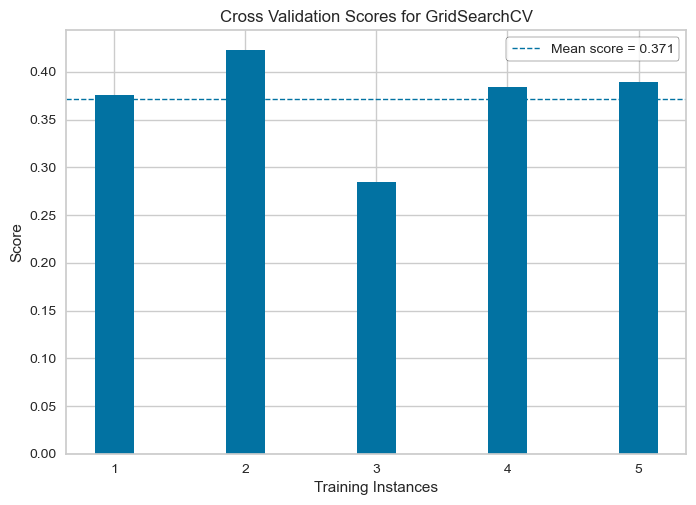

In [15]:
model = gradient_grid_search
visualizer = cv_scores(model, X_train, y_train)

In [16]:
gradient_grid_search_test_score = gradient_grid_search.best_estimator_.score(X_test, y_test)
gradient_grid_search_train_score = gradient_grid_search.best_estimator_.score(X_train, y_train)
gradient_best_params = gradient_grid_search.best_params_
print("The test score is :", gradient_grid_search_test_score)
print("The test score is :", gradient_grid_search_train_score)
print("The best parameters is :", gradient_best_params)

The test score is : 0.45031741345045084
The test score is : 0.6313633845223823
The best parameters is : {'regressor__learning_rate': 0.01, 'regressor__max_depth': 8, 'regressor__n_estimators': 400, 'regressor__subsample': 0.1}


In [17]:
res = gradient_grid_search.cv_results_
res = pd.DataFrame(res)
columns_of_interest = [i for i in res.columns if "split" not in i]
res =res[columns_of_interest].sort_values("rank_test_r2")
res.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_regressor__learning_rate,param_regressor__max_depth,param_regressor__n_estimators,param_regressor__subsample,params,mean_test_r2,std_test_r2,rank_test_r2,mean_train_r2,std_train_r2,mean_test_nmse,std_test_nmse,rank_test_nmse,mean_train_nmse,std_train_nmse,mean_test_mae,std_test_mae,rank_test_mae,mean_train_mae,std_train_mae,mean_test_explained_variance,std_test_explained_variance,rank_test_explained_variance,mean_train_explained_variance,std_train_explained_variance,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error,mean_train_neg_mean_absolute_percentage_error,std_train_neg_mean_absolute_percentage_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,mean_train_neg_root_mean_squared_error,std_train_neg_root_mean_squared_error
224,0.815144,0.006449,0.027170,0.003470,0.01,8,400,0.1,"{'regressor__learning_rate': 0.01, 'regressor_...",0.375557,0.034286,1,0.634318,0.016138,-1566.685930,59.693864,1,-919.877624,32.592479,-28.882739,0.604796,57,-22.181974,0.498285,0.380300,0.035139,1,0.634767,0.016086,-5.043176e+14,7.132128e+14,43,-4.200875e+14,2.972764e+14,-39.574099,0.759353,1,-30.324747,0.536069
165,2.107685,0.008963,0.018807,0.000844,0.01,2,800,1.0,"{'regressor__learning_rate': 0.01, 'regressor_...",0.374341,0.016555,2,0.562566,0.014082,-1574.493202,114.549213,2,-1100.814040,37.183039,-28.491663,0.318316,35,-24.373454,0.675923,0.378683,0.018740,2,0.562566,0.014082,-4.378633e+14,6.192322e+14,15,-2.251111e+14,1.597905e+14,-39.653850,1.437142,2,-33.173840,0.557120
170,2.704126,0.048213,0.020509,0.002112,0.01,2,1000,1.0,"{'regressor__learning_rate': 0.01, 'regressor_...",0.373401,0.018786,3,0.591817,0.011534,-1577.229247,121.836477,4,-1027.190537,30.232409,-28.376615,0.420269,23,-23.541973,0.573331,0.377634,0.020884,3,0.591817,0.011534,-4.442061e+14,6.282022e+14,17,-2.071809e+14,1.468254e+14,-39.684944,1.527900,4,-32.046377,0.469345
182,1.229637,0.025006,0.019000,0.002161,0.01,3,400,0.7,"{'regressor__learning_rate': 0.01, 'regressor_...",0.373349,0.029023,4,0.607151,0.019474,-1575.495881,107.496614,3,-988.893679,55.935712,-28.422539,0.264224,30,-23.321867,0.848195,0.377288,0.031733,4,0.607157,0.019469,-5.509015e+14,7.790924e+14,82,-3.228411e+14,2.291316e+14,-39.669072,1.364052,3,-31.434332,0.881162
181,1.418358,0.034460,0.020292,0.002327,0.01,3,400,0.9,"{'regressor__learning_rate': 0.01, 'regressor_...",0.370746,0.024951,5,0.608176,0.016934,-1581.927472,99.980956,5,-986.531294,54.203617,-28.555128,0.349759,40,-23.251461,0.824541,0.374679,0.027624,6,0.608177,0.016933,-5.003528e+14,7.076057e+14,39,-2.994247e+14,2.118483e+14,-39.753408,1.262538,5,-31.397449,0.855277
175,3.240221,0.068280,0.020502,0.000442,0.01,2,1200,1.0,"{'regressor__learning_rate': 0.01, 'regressor_...",0.370319,0.023042,6,0.615443,0.010689,-1585.103807,127.979716,6,-967.788482,29.793751,-28.278676,0.563419,17,-22.822402,0.552300,0.374684,0.025396,5,0.615443,0.010689,-4.524790e+14,6.399019e+14,19,-1.902325e+14,1.347954e+14,-39.780990,1.605198,6,-31.105650,0.476489
187,2.475516,0.005610,0.021000,0.001415,0.01,3,800,0.7,"{'regressor__learning_rate': 0.01, 'regressor_...",0.368747,0.041124,7,0.707634,0.022092,-1586.480974,121.156222,7,-735.930919,59.528774,-28.026650,0.543777,2,-20.108617,0.911974,0.372187,0.043677,8,0.707637,0.022091,-5.914799e+14,8.364789e+14,125,-2.352501e+14,1.665667e+14,-39.800791,1.542068,7,-27.106287,1.086334
177,2.915364,0.018939,0.022174,0.000617,0.01,2,1200,0.7,"{'regressor__learning_rate': 0.01, 'regressor_...",0.368432,0.028048,8,0.627767,0.020318,-1589.056713,123.505588,10,-937.004232,57.428814,-28.220030,0.382862,13,-22.496464,0.802706,0.372307,0.030386,7,0.627767,0.020318,-5.833863e+14,8.250329e+14,115,-3.191225e+14,2.271904e+14,-39.832587,1.556201,10,-30.596425,0.928999
201,1.758834,0.014439,0.021351,0.001653,0.01,4,400,0.9,"{'r

<code>GridSearchCV</code> does'nt give a better score but its best parameters reduce the gap between train score and test score.

Let's try another tuning method.

In [18]:
gradient_pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(learning_rate=0.01, min_samples_leaf=5,
                          min_samples_split=17, n_estimators=800,
                          random_state=42, subsample=1.0))])

#pipe.fit(X_train, y_train)
#pipe.score(X_test, y_test)
model = TransformedTargetRegressor(regressor=gradient_pipe, transformer=StandardScaler())
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.423371814784683

In [19]:
model.score(X_train, y_train)

0.6069856871974055

In [20]:
def search_tuning(pipe: Pipeline, X_train: np.ndarray,
                  X_test: np.ndarray, y_train: np.ndarray,
                  y_test: np.ndarray, model_params: Dict[str, List[Dict[str, object]]], 
                  cv: int, tuning_model: str = 'GridSearchCV') -> Tuple[Dict[str, GridSearchCV], pd.DataFrame]:
    """
    Perform hyperparameter tuning using GridSearchCV or RandomizedSearchCV on multiple models and return the best scores and models.

    Args:
        pipe (Pipeline): a Scikit-Learn Pipeline object.
        X_train (ndarray): the training dataset.
        X_test (ndarray): the test dataset.
        y_train (ndarray): the target variable of the training dataset.
        y_test (ndarray): the target variable of the test dataset.
        model_params (dict): a dictionary containing the name of each model as a key and a list of dictionaries 
                             with the hyperparameters to test for each model as values.
        cv (int): number of cross-validation folds to perform in GridSearchCV or RandomizedSearchCV.
        tuning_model (str): the hyperparameter tuning model to use. Possible values are 'GridSearchCV', 'RandomizedSearchCV' and 'BayesSearchCV'.

    Returns:
        A tuple containing two objects:
        - A dictionary with the best GridSearchCV, RandomizedSearchCV or BayesSearchCV estimator for each model.
        - A Pandas DataFrame containing the mean test score, test score, and train score for the best estimator for each model.
    """
    if tuning_model not in ['GridSearchCV', 'RandomizedSearchCV', 'BayesSearchCV']:
        raise ValueError("Invalid tuning_model parameter. Possible values are 'GridSearchCV', 'RandomizedSearchCV' and 'BayesSearchCV'.")
    
    best_score = {}
    searchCV = {}
    # loop through the models to be tested
    for model_name, param_grid in model_params.items():
        print("*" * 85)
        print(f"{'Proceding ' + tuning_model + ' for ' + model_name + '...':^85}")
        print("*" * 85)  

        # perform hyperparameter tuning using the specified model
        if tuning_model == 'GridSearchCV':
            search = GridSearchCV(pipe, param_grid=param_grid, cv=cv, return_train_score=True, n_jobs=-1, verbose=1, error_score="raise")
        elif tuning_model == 'RandomizedSearchCV':
            search = RandomizedSearchCV(pipe, param_distributions=param_grid, cv=cv, n_iter=100, random_state=42, return_train_score=True, n_jobs=-1, verbose=1, error_score="raise")
        elif tuning_model == 'BayesSearchCV':
            search = BayesSearchCV(pipe, param_grid, cv=cv, n_iter=100, return_train_score=True, n_jobs=-1, error_score="raise")

        # fit the model and save the best scores and best estimator
        searchCV[model_name] = search.fit(X_train, y_train)
        best_score[model_name] = [search.best_score_, search.best_estimator_.score(X_test, y_test),
                                  search.best_estimator_.score(X_train, y_train)]
        # get the best hyperparameters and print them        
        best_index = search.best_index_
        std_score = search.cv_results_['std_test_score'][best_index]
        print(f"\nBest {tuning_model} hyperparameters for {model_name}:")
        for param_name, param_value in searchCV[model_name].cv_results_['params'][best_index].items():
            if param_name != 'regressor':
                    best_parameter = search.best_estimator_.get_params()[param_name]
                    param_name = param_name.split("regressor__")[1] 
                    print(f"{param_name}: {param_value}")
                    # print the best scores
        print("_" * 105)
        print(f" Mean cross-validated score of the best estimator for {model_name}: R² = {search.best_score_:.3f} ± {std_score:.3f} ")
        print( "_" * 105 ) 
            

    # create a DataFrame with the results for the best estimator
    results_df = pd.DataFrame({'mean_test_score': searchCV[model_name].cv_results_['mean_test_score'][best_index],
                               'test_score': searchCV[model_name].best_estimator_.score(X_test, y_test),
                               'train_score': searchCV[model_name].best_estimator_.score(X_train, y_train)},
                              index=[0])

    # return the best estimator and the results for the best estimator
    return searchCV, results_df

In [21]:
# Define the search space for RandomForestRegressor
rfr_grid = [{"regressor": [RandomForestRegressor(random_state=42)],
             #'regressor__bootstrap': [True, False],
            "regressor__n_estimators": [100, 500,1000, 2000, 3000],
            "regressor__max_depth": [1, 3, 10, 15, 30, 40, 50, 60, 70, 80, 90],
            "regressor__max_features": ["log2", "sqrt", "auto"],
            #  "regressor__min_samples_split": [2, 5, 10, 16, 20, 30],
            #"regressor__min_samples_leaf" : [2,  5, 10, 16, 20, 30]
            }]

# Define the search space for XGBRegressor
xgbr_grid =[{"regressor": [XGBRegressor(random_state=42)],
        "regressor__max_depth": [3, 5, 8, 15],
        "regressor__learning_rate": [0.1, 0.01, 0.02, 0.05],
        "regressor__gamma": [0, 0.25, 1.0],
        "regressor__lambda": [0, 1.0, 10.0],
    }]
    
    
# Define the search space for GradientBoostingRegressor
    
gbr_grid = [{"regressor": [GradientBoostingRegressor(random_state=42)],
                "regressor__max_depth": [2, 5, 6, 8],
                "regressor__learning_rate": [0.01,0.02,0.03,0.04, 0.1],
                "regressor__n_estimators": [100,500,800, 1000, 1200],
                "regressor__subsample": [1.0, 0.9, 0.7, 0.3, 0.1],
            }]  


# Define the search space for ExtraTreesRegressor
etr_grid =[{"regressor": [ExtraTreesRegressor(random_state=42)],
        #"regressor__max_depth": [ 3,1, 2, 4, None],
        #"regressor__learning_rate": [0.1 , 0.09, 0.07 ,0.05, 0.01],
        "regressor__n_estimators":  [100, 500, 1000, 1200],
        #"regressor__subsample": [1.0, 0.9, 0.7,  0.1],
        'regressor__max_features': [3, 6, 18, 23, 29, 30],
        'regressor__min_samples_leaf': [2, 6, 10, 18, 23, 29, 30],
        'regressor__min_samples_split': [2, 6, 5, 8, 10, 15, 18],
       }]


# Define the search space for KNeighborsRegressor
knnr_grid = [{'regressor': [KNeighborsRegressor()],
                "regressor__n_neighbors": [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 15],
                "regressor__weights": ["uniform", "distance"],
                }]


# Define the search space for ElasticNet
elasticnet_grid =  [{"regressor": [ElasticNet(random_state=42)],
                    "regressor__alpha": [3, 5, 8, 10, 15, 18, 21],
                    "regressor__l1_ratio": [0.01,0.02,0.03,0.04],
                    "regressor__tol": [100,500,1000, 1500],
                        }]


# Define the search space for LinearRegression    
lr_params = [{"regressor": [LinearRegression()],
             'regressor__fit_intercept': [True, False],
             }]


# Define the search space for Ridge
ridge_grid = [{"regressor": [Ridge(random_state=42)],
                'regressor__alpha':(np.logspace(-8, 8, 100)),
                'regressor__max_iter':list(range(100, 10000, 500)),
               'regressor__solver':['svd', 'cholesky', 'lsqr', 'sag'],
              #  'regressor__tol':[0.001],
              }]


# Define the search space for Lasso
lasso_grid = [{"regressor": [Lasso(random_state=42)],
                'regressor__alpha':[1,0.1,0.01,0.001],
                'regressor__max_iter':list(range(100, 10000, 500)),
                #'regressor__tol':[0.001],
              }]


In [22]:
model_params = { 'Random Forest Regressor': rfr_grid, 
               'Gradient Boosting Regressor':gbr_grid,
               'Extra Tree Regressor': etr_grid,
               "XGB Regressor" : xgbr_grid,
               'Elastic Net' : elasticnet_grid,                 
               'KNeighbors Regressor': knnr_grid,
                "Linear Regression" : lr_params,
                "Lasso" : lasso_grid,
                "Ridge" : ridge_grid,
                  }

In [23]:
pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',GradientBoostingRegressor(random_state=42))])


shuffle = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
kf = KFold(n_splits=3, shuffle=True, random_state=42)

In [24]:
tuning_model = 'GridSearchCV'
searchCV, score_table = search_tuning(pipe, X_train,
                                      X_test, y_train,
                                      y_test, model_params, 
                                      kf, tuning_model)

*************************************************************************************
                Proceding GridSearchCV for Random Forest Regressor...                
*************************************************************************************
Fitting 3 folds for each of 165 candidates, totalling 495 fits

Best GridSearchCV hyperparameters for Random Forest Regressor:
max_depth: 10
max_features: log2
n_estimators: 1000
_________________________________________________________________________________________________________
 Mean cross-validated score of the best estimator for Random Forest Regressor: R² = 0.380 ± 0.043 
_________________________________________________________________________________________________________
*************************************************************************************
              Proceding GridSearchCV for Gradient Boosting Regressor...              
********************************************************************************

In [25]:
# Define the search space for each regressor using BayesSearchCV

# Random Forest Regressor
rfr_bayes_grid = [
    {
        "regressor": [RandomForestRegressor(random_state=42)],
        'regressor__bootstrap': [True, False],
        "regressor__n_estimators": Integer(100, 3500),
        "regressor__max_depth": Integer(1, 100),
        "regressor__max_features": ["sqrt", "log2", None],
        "regressor__min_samples_split": Integer(2, 50),
        "regressor__min_samples_leaf": Integer(2, 50),
    }
]

# XGBoost Regressor
xgbr_bayes_grid = [
    {
        "regressor": [XGBRegressor(random_state=42)],
        "regressor__max_depth": Integer(1, 30),
        "regressor__learning_rate": Real(0.01, 0.1),
        "regressor__gamma": [0, 0.25, 1.0],
        "regressor__lambda": [0, 1.0, 10.0],
    }
]

# Gradient Boosting Regressor
gbr_bayes_grid = [
    {
        "regressor": [GradientBoostingRegressor(random_state=42)],
        "regressor__max_depth": Integer(1, 10),
        "regressor__learning_rate": Real(0.01, 0.1),
        "regressor__n_estimators": Integer(100, 3500),
        "regressor__subsample": [1.0, 0.9, 0.7, 0.3, 0.1],
    }
]

# Extra Trees Regressor
etr_bayes_grid = [
    {
        "regressor": [ExtraTreesRegressor(random_state=42)],
        "regressor__n_estimators": Integer(100, 3500),
        "regressor__max_features": Integer(2, 50),
        "regressor__min_samples_leaf": Integer(2, 50),
        "regressor__min_samples_split": Integer(2, 50),
    }
]

# K-Nearest Neighbors Regressor
knnr_bayes_grid = [
    {
        "regressor": [KNeighborsRegressor()],
        "regressor__n_neighbors": Integer(1, 20),
        "regressor__weights": ["uniform", "distance"],
    }
]

# Elastic Net Regressor
elasticnet_bayes_grid = [
    {
        "regressor": [ElasticNet(random_state=42)],
        "regressor__alpha": Integer(1, 30),
        "regressor__l1_ratio": Real(0.01, 0.1),
        "regressor__tol": Integer(100, 3500),
    }
]

# Linear Regression
lr_bayes_params = [
    {
        "regressor": [LinearRegression()],
        'regressor__fit_intercept': [True, False],
    }
]

# Ridge Regressor
ridge_bayes_grid = [
    {
        "regressor": [Ridge(random_state=42)],
        "regressor__alpha": (np.logspace(-8, 8, 100)),
        "regressor__max_iter": Integer(100, 10000),
        "regressor__solver": ["svd", "cholesky", "lsqr", "sag"],
    }
]

# Lasso Regressor
lasso_bayes_grid = [
    {
        "regressor": [Lasso(random_state=42)],
        "regressor__alpha": Real(0.001, 1),
        "regressor__max_iter": Integer(100, 10000),
    }
]


In [26]:
bayes_model_params = { 'Random Forest Regressor': rfr_bayes_grid, 
               'Gradient Boosting Regressor':gbr_bayes_grid,
               'Extra Tree Regressor': etr_bayes_grid,
               "XGB Regressor" : xgbr_bayes_grid,
               'Elastic Net' : elasticnet_bayes_grid,                 
               'KNeighbors Regressor': knnr_bayes_grid,
                "Linear Regression" : lr_bayes_params,
                "Lasso" : lasso_bayes_grid,
                "Ridge" : ridge_bayes_grid,
                  }

In [27]:
tuning_model = 'BayesSearchCV'
bayesCV, bayes_score_table = search_tuning(pipe, X_train,
                                      X_test, y_train,
                                      y_test, bayes_model_params, 
                                      kf, tuning_model)

*************************************************************************************
               Proceding BayesSearchCV for Random Forest Regressor...                
*************************************************************************************

Best BayesSearchCV hyperparameters for Random Forest Regressor:
bootstrap: False
max_depth: 99
max_features: sqrt
min_samples_leaf: 2
min_samples_split: 12
n_estimators: 3500
_________________________________________________________________________________________________________
 Mean cross-validated score of the best estimator for Random Forest Regressor: R² = 0.385 ± 0.044 
_________________________________________________________________________________________________________
*************************************************************************************
             Proceding BayesSearchCV for Gradient Boosting Regressor...              
***********************************************************************************

In [28]:
score_table

,mean_test_score,test_score,train_score
0,0.3602,0.406987,0.411312


In [29]:
def get_best_model(CV_dict: Dict[str, BaseEstimator]) -> BaseEstimator:
    """
    Get the best model from a dictionary of cross-validated models.

    Args:
        CV_dict (dict): A dictionary containing cross-validated models.

    Returns:
        The best model (BaseEstimator).

    """
    best_score = 0  # Initialize the best score variable to keep track of the highest score
    best_model_name = ''  # Initialize the best model name variable to store the name of the best model
    best_model = None  # Initialize the best model variable to store the best model object

    # Iterate over each model in the dictionary
    for model_name, model in CV_dict.items():
        if model.best_score_ > best_score:  # Check if the current model's score is higher than the best score
            best_model_name = model_name  # Update the best model name
            best_score = model.best_score_  # Update the best score
            best_model = model.best_estimator_  # Update the best model

    print("\nThe overall best cross-validated score is: R² = {:.3f}".format(best_score))
    print("The best model is {} with parameters:".format(best_model_name))

    best_params = CV_dict[best_model_name].best_params_  # Get the best parameters of the best model

    # Iterate over the best parameters and print them
    for parameter, _ in best_params.items():
        if parameter != 'regressor':  # Exclude the 'regressor' parameter
            best_parameter = best_params[parameter]
            parameter = parameter.split("regressor__")[1]  # Extract the parameter name without 'regressor__' prefix
            print("  - " + parameter + ":", best_parameter)

    return best_model  # Return the best model


In [30]:
grid_best_model = get_best_model(searchCV)


The overall best cross-validated score is: R² = 0.399
The best model is Extra Tree Regressor with parameters:
  - max_features: 6
  - min_samples_leaf: 2
  - min_samples_split: 8
  - n_estimators: 1200


In [31]:
bayes_best_model = get_best_model(bayesCV)


The overall best cross-validated score is: R² = 0.401
The best model is Extra Tree Regressor with parameters:
  - max_features: 7
  - min_samples_leaf: 2
  - min_samples_split: 14
  - n_estimators: 100


In [32]:
bayes_score_table

,mean_test_score,test_score,train_score
0,0.359424,0.406205,0.410837


In [33]:
# Evaluate the model's performance on the test data
print("Test score is:", grid_best_model.score(X_test, y_test))

# Evaluate the model's performance on the training data
print("Train score is:", grid_best_model.score(X_train, y_train))

Test score is: 0.4282819629927018
Train score is: 0.6690017100121818


By applying the ExtraTreeregressor on our data, the result is under the result of our gradient boosting model.

For this reason, we choose gradient boosting regressor for the threst of our analysis.

<a id="fp"></a>
#### <span style="color:#33afff  ;"> Gradient Boosting Regression  Hyperparameters tuning With TuneGridSearchCV</span>

In [34]:
# Define the search space for GradientBoostingRegressor

param_grid = {
        "regressor__max_depth": [ 2, 3,4],
        "regressor__learning_rate": [0.1 , 0.09, 0.07 , 0.01],
        "regressor__n_estimators": [100, 950, 1000, 1100],
        "regressor__subsample": [1.0, 0.9, 0.7,  0.1],
        "regressor__min_samples_split": [3, 4, 5],
        "regressor__min_samples_leaf" : [2, 3, 5]  
       }
skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
sgk = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)
sss = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
shuffle = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
kf = KFold(n_splits=5, shuffle=True, random_state=42)
gradient_pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(random_state=42))])


gradient_tune_search = TuneGridSearchCV(gradient_pipe,
                                   param_grid,
                                   cv=kf,
                                   return_train_score=True, 
                                   max_iters=50)

gradient_tune_search.fit(X_train, y_train)

(raylet) C:\Users\Adonija\anaconda3\envs\regression10\lib\site-packages\ray\dashboard\modules\reporter\reporter_agent.py:56: UserWarning: `gpustat` package is not installed. GPU monitoring is not available. To have full functionality of the dashboard please install `pip install ray[default]`.)
(raylet)   warnings.warn(
(_Trainable pid=8132) C:\Users\Adonija\anaconda3\envs\regression10\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
(_Trainable pid=8132)   warnings.warn(
(_Trainable pid=11696) C:\Users\Adonija\anaconda3\envs\regression10\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value. [repeated 78x across cluster] (Ray deduplic

TuneGridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                 estimator=Pipeline(steps=[('preprocessors',
                                            ColumnTransformer(transformers=[('num',
                                                                             Pipeline(steps=[('imputer',
                                                                                              SimpleImputer()),
                                                                                             ('scaler',
                                                                                              RobustScaler())]),
                                                                             Index(['GFAPerFloor', 'NumberoffloorGFAProportion', 'BuildingHeight',
       'LargestPropertyUseTypeGFA', 'MeanAgeByLargestPropertyUseType',...
                                            GradientBoostingRegressor(random_state=42))]),
                 mode='max', n_jobs=-1,
                 param_grid={'regressor__learning_rate': [0.1, 0.09, 0.07,
                                                          0.01],
                             'regressor__max_depth': [2, 3, 4],
                             'regressor__min_samples_leaf': [2, 3, 5],
                             'regressor__min_samples_split': [3, 4, 5],
                             'regressor__n_estimators': [100, 950, 1000, 1100],
                             'regressor__subsample': [1.0, 0.9, 0.7, 0.1]},
                 return_train_score=True, sk_n_jobs=1)

In [35]:
gradient_tune_search.best_estimator_

Pipeline(steps=[('preprocessors',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  Index(['GFAPerFloor', 'NumberoffloorGFAProportion', 'BuildingHeight',
       'LargestPropertyUseTypeGFA', 'MeanAgeByLargestPropertyUseType',
       'YearBuilt', 'MeanAgeByPrimaryPropertyType',
       'SecondLargestPropertyUseTypeGFA',...
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['PrimaryPropertyType', 'MainEnergy'], dtype='object'))])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.09, max_depth=2,
                                           min_samples_leaf=2,
                                           min_samples_split=5, random_state=42,
                                           subsample=0.9))])

In [79]:
tune_params = gradient_tune_search.best_params_
tune_params

{'regressor__max_depth': 2,
 'regressor__learning_rate': 0.09,
 'regressor__n_estimators': 100,
 'regressor__subsample': 0.9,
 'regressor__min_samples_split': 5,
 'regressor__min_samples_leaf': 2}

In [37]:
gradient_tune_search.best_score

0.39555818481356486

In [38]:
gradient_tune_search.best_estimator_.score(X_test, y_test)

0.46213616140380454

In [39]:
gradient_tune_search.best_estimator_.score(X_train, y_train)

0.5433935779473253

In [40]:
model = TransformedTargetRegressor(regressor=gradient_pipe, transformer=StandardScaler())
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.4278859544256419

In [41]:
model.score(X_train, y_train)

0.6783212857183734

pipe = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', RandomForestRegressor(random_state=42))
])

param_grid = {
    "regressor__n_estimators": [100, 500, 1000, 2000, 3000],
    "regressor__max_depth": [1, 3, 10, 15, 30, 40, 50, 60, 70, 80, 90],
    "regressor__max_features": ["log2", "sqrt", 1.0],
    "regressor__min_samples_split": [2, 5, 10, 16, 20, 30],
    "regressor__min_samples_leaf": [2, 5, 10, 16, 20, 30]
}

kf = KFold(n_splits=5, shuffle=True, random_state=42)

rfr_tune_search = TuneGridSearchCV(
    pipe,
    param_grid=param_grid,
    cv=kf,
    return_train_score=True,
    max_iters=50
)

rfr_tune_search.fit(X_train, y_train)


rfr_tune_search.best_estimator_

rfr_tune_search.best_estimator_.score(X_test, y_test)

rfr_tune_search.best_estimator_.score(X_train, y_train)

In [42]:
def objective(space):
    """
    Objective function for hyperparameter optimization using Bayesian optimization.

    Args:
        space (dict): Hyperparameter configuration space.

    Returns:
        Dictionary containing the loss (negative RMSE) and status.

    """
    shuffle = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)  # ShuffleSplit for cross-validation
    kfold = KFold(n_splits=10, shuffle=True, random_state=42)  # KFold for cross-validation
    estimator_clone = clone(pipe).set_params(**space)  # Create a clone of the pipeline with hyperparameters set
    scores = cross_val_score(estimator_clone, X_train, y_train, cv=kfold,
                             scoring='neg_root_mean_squared_error', n_jobs=-1)  # Perform cross-validation
    loss = -1 * np.mean(scores)  # Calculate the negative mean RMSE loss
    return {'loss': loss, 'status': STATUS_OK}

In [45]:
# Define the search space for hyperparameters
param_grid = {
        "regressor__max_depth": hp.randint('max_depth', 1, 10),
        "regressor__learning_rate": hp.uniform('learning_rate', 0.01, 1),
        "regressor__n_estimators":100 + hp.randint("n_estimators", 2000), 
        "regressor__subsample": hp.uniform('subsample', 0.01, 1),
         "regressor__min_samples_split":  hp.randint("min_samples_split", 2, 40),
        "regressor__min_samples_leaf" :  hp.randint("min_samples_leaf", 1, 40)
    }

# Define the pipeline with preprocessors and a RandomForestRegressor
pipe = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(random_state=42))
])

shuffle = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)  # ShuffleSplit for cross-validation

tpe_trials = Trials()  # Create an instance of Trials to track the optimization process

# Perform hyperparameter optimization using TPE algorithm
best = fmin(objective,
            space=param_grid,
            algo=tpe.suggest,
            max_evals=200,
            rstate=np.random.default_rng(42),
            trials=tpe_trials)

print(best)  # Print the best hyperparameters found during optimization

100%|██████████| 200/200 [23:59<00:00,  7.20s/trial, best loss: 38.79446186032203]
{'learning_rate': 0.011792786147507544, 'max_depth': 3, 'min_samples_leaf': 25, 'min_samples_split': 5, 'n_estimators': 744, 'subsample': 0.7195704339822866}


Showing Histogram of 200 jobs


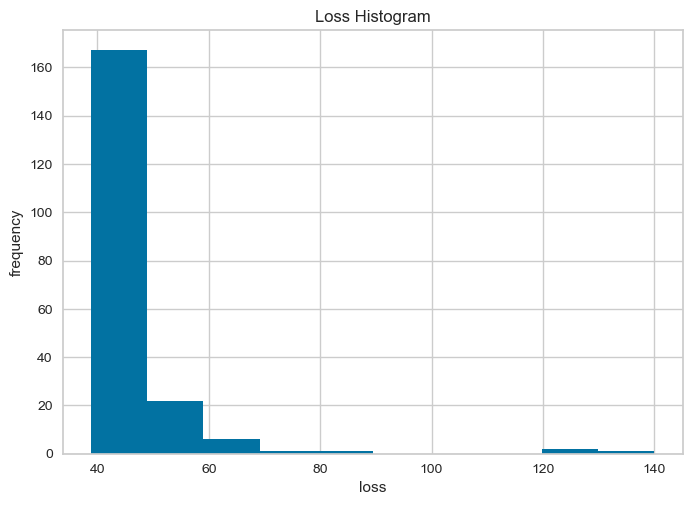

avg best error: 38.79446186032203


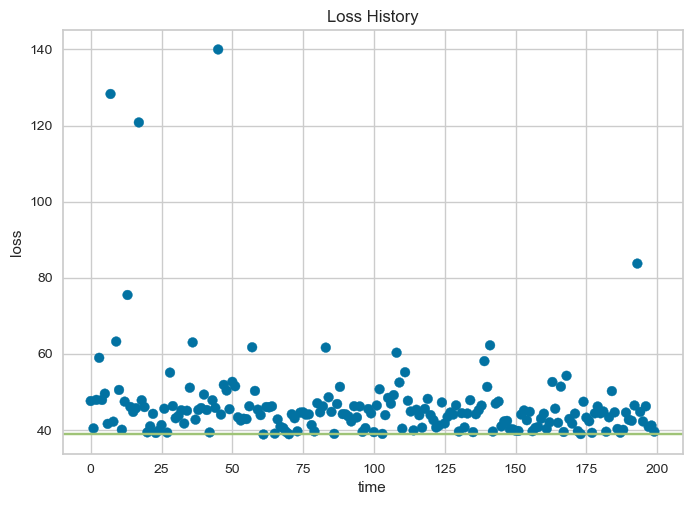

finite loss range 38.79446186032203 140.0057499930625 37.79446186032203


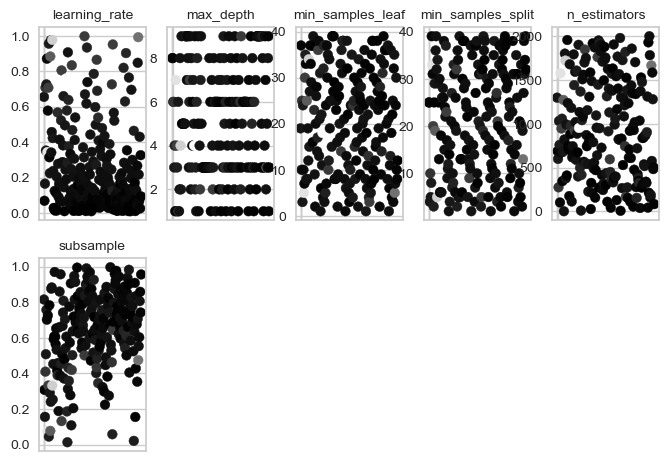

In [46]:

# Plot a histogram of the hyperparameter distributions
plotting.main_plot_histogram(tpe_trials)

# Plot the history of the optimization process
plotting.main_plot_history(tpe_trials)

# Plot the values of the hyperparameters during optimization
plotting.main_plot_vars(tpe_trials)

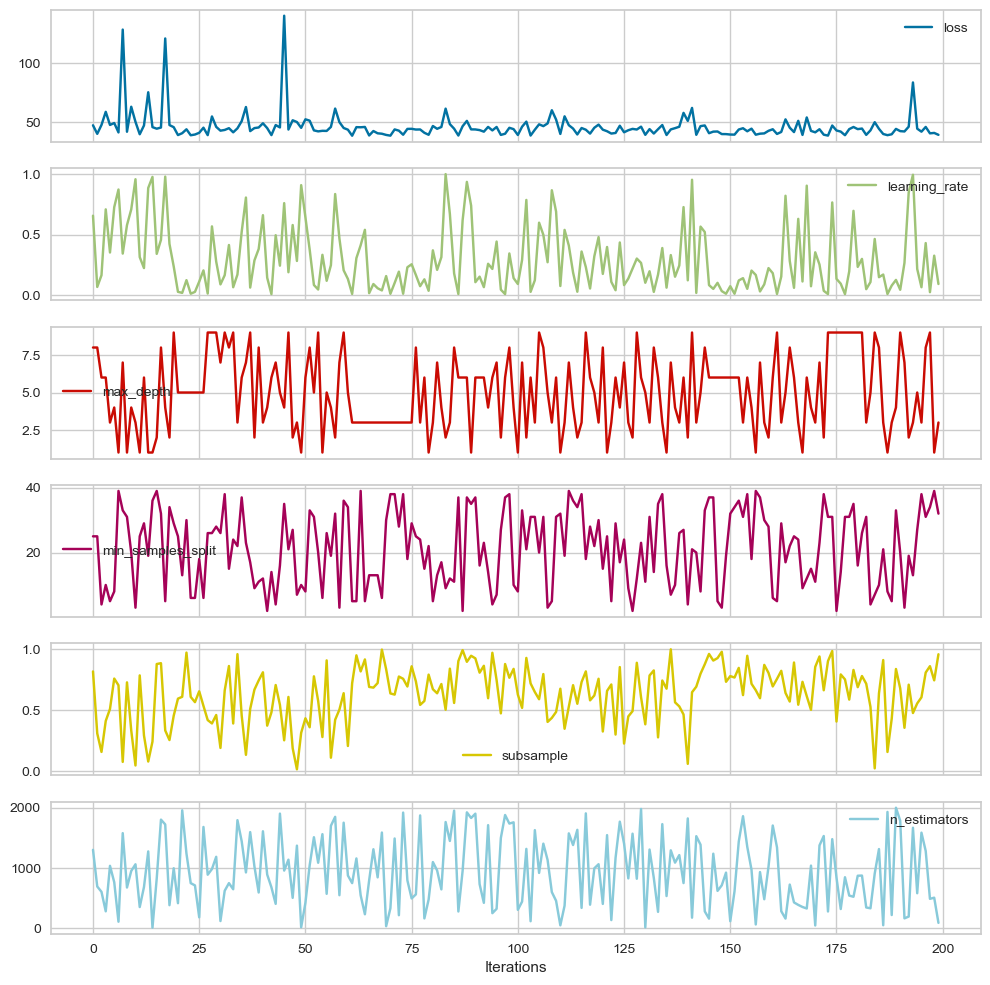

In [47]:
# Extract relevant information from tpe_trials and create a numpy array
plotting_data = np.array([
    [
        x["result"]["loss"],
        x["misc"]["vals"]["learning_rate"][0],
        x["misc"]["vals"]["max_depth"][0],
        x["misc"]["vals"]["min_samples_split"][0],
        x["misc"]["vals"]["subsample"][0],
        x["misc"]["vals"]["n_estimators"][0],
    ] for x in tpe_trials.trials
])

# Create a DataFrame with the extracted data
plotting_data = pd.DataFrame(
    plotting_data,
    columns=["loss", "learning_rate", "max_depth", "min_samples_split", "subsample", "n_estimators"]
)

# Plot subplots for each column in the DataFrame
plotting_data.plot(subplots=True, figsize=(12, 12))

# Set the x-axis label
plt.xlabel("Iterations")

# Display the plot
plt.show()

In [48]:
# Create a pipeline with preprocessors and a GradientBoostingRegressor using the best hyperparameters
model = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(**best, random_state=42))
])

# Fit the model on the training data
model.fit(X_train, y_train)

# Evaluate the model's performance on the test data
test_score = model.score(X_test, y_test)
print("Test score is:", test_score)

# Evaluate the model's performance on the training data
train_score = model.score(X_train, y_train)
print("Train score is:", train_score)

Test score is: 0.42977013768124506
Train score is: 0.5617044928469894


In [49]:
params={'learning_rate': 0.03672777587771769, 
'max_depth':8, 
'min_samples_leaf': 8,
'min_samples_split': 5,
'n_estimators': 158,
'subsample': 0.7380649633417082}

pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',GradientBoostingRegressor(**best,random_state=42))])

pipe.fit(X_train, y_train)
print("Test score is : ", pipe.score(X_test, y_test))
print("Train score is : ",pipe.score(X_train, y_train))

Test score is :  0.42977013768124506
Train score is :  0.5617044928469894


In [50]:
param_grid = {
        "regressor__max_depth": hp.randint('max_depth', 1, 10),
        "regressor__learning_rate": hp.uniform('learning_rate', 0.01, 1),
        "regressor__n_estimators":100 + hp.randint("n_estimators", 1500), 
        "regressor__subsample": hp.uniform('subsample', 0.01, 1),
         "regressor__min_samples_split":  hp.randint("min_samples_split", 2, 10),
        "regressor__min_samples_leaf" :  hp.randint("min_samples_leaf", 1, 10)
    }
# Create a pipeline with preprocessors and a GradientBoostingRegressor
pipe = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(random_state=42))
])

# Define the shuffle split cross-validation
shuffle = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Create trials object to track the optimization process
rand_trials = Trials()

# Perform random search for hyperparameter optimization
best_rand = fmin(
    objective,
    space=param_grid,
    algo=rand.suggest,
    max_evals=100,
    rstate=np.random.default_rng(42),
    trials=rand_trials
)

# Print the best hyperparameters found
print(best_rand)

100%|█████████| 100/100 [11:43<00:00,  7.04s/trial, best loss: 39.301158271254614]
{'learning_rate': 0.01690239422316003, 'max_depth': 11, 'min_samples_leaf': 21, 'min_samples_split': 3, 'n_estimators': 457, 'subsample': 0.6342949879081504}


Showing Histogram of 100 jobs


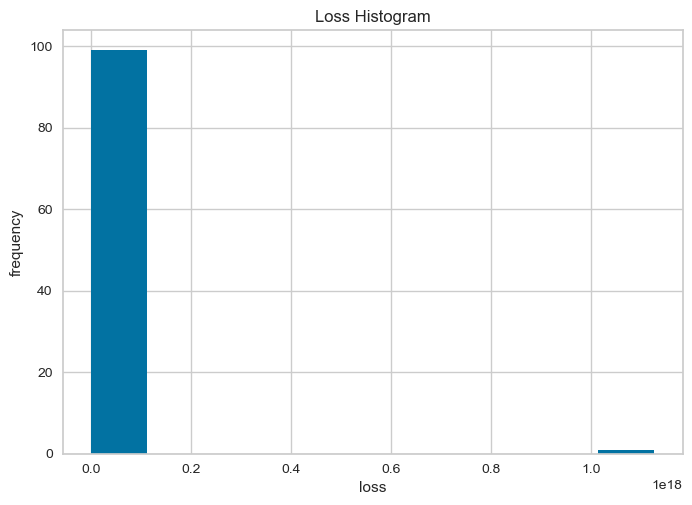

avg best error: 39.301158271254614


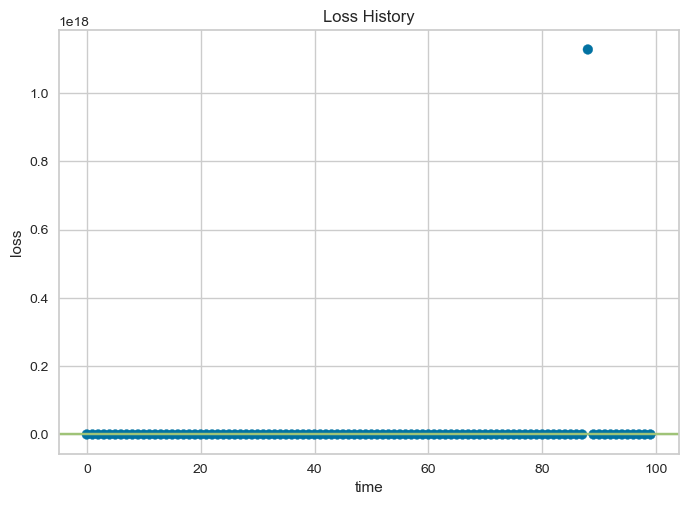

finite loss range 39.301158271254614 1.1272307131845318e+18 38.301158271254614


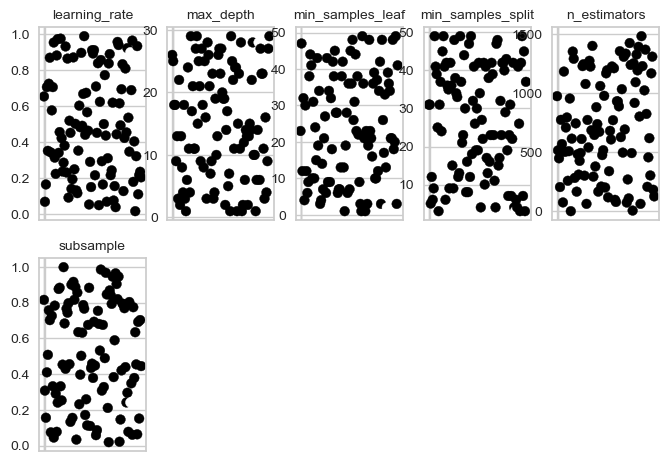

In [51]:
# Plot histogram of the random search trials
plotting.main_plot_histogram(rand_trials)

# Plot optimization history
plotting.main_plot_history(rand_trials)

# Plot variables during optimization
plotting.main_plot_vars(rand_trials)

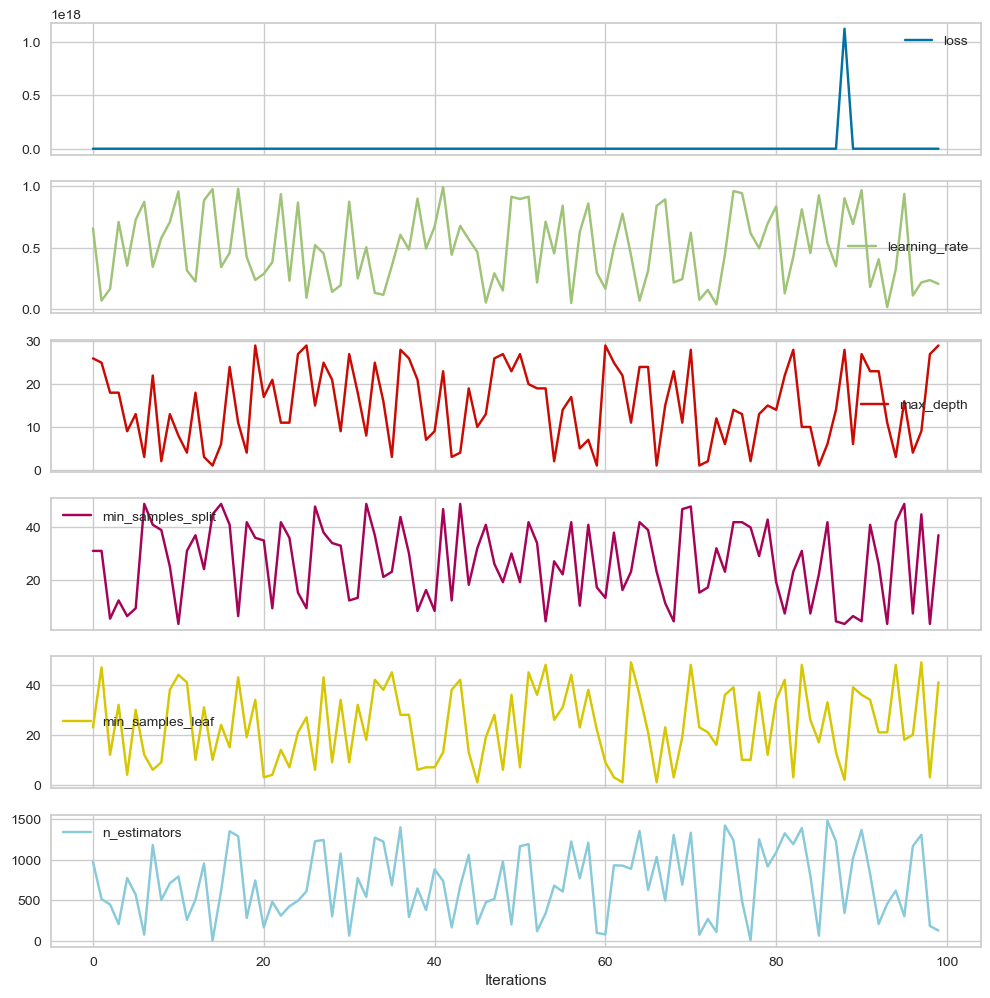

In [52]:
# Extract relevant data from the random search trials
plotting_data = np.array([
    [
        x["result"]["loss"],
        x["misc"]["vals"]["learning_rate"][0],
        x["misc"]["vals"]["max_depth"][0],
        x["misc"]["vals"]["min_samples_split"][0],
        x["misc"]["vals"]["min_samples_leaf"][0],
        x["misc"]["vals"]["n_estimators"][0],
    ] for x in rand_trials.trials
])

# Create a DataFrame from the extracted data
plotting_data = pd.DataFrame(
    plotting_data,
    columns=["loss", "learning_rate", "max_depth", "min_samples_split", "min_samples_leaf", "n_estimators"]
)

# Plot subplots of hyperparameters and their values over iterations
plotting_data.plot(subplots=True, figsize=(12, 12))
plt.xlabel("Iterations")
plt.show()

In [53]:
# Create a pipeline with the best hyperparameters obtained from the random search
model = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(**best_rand, random_state=42))
])

# Fit the model to the training data
model.fit(X_train, y_train)

# Evaluate the model's performance on the test and train sets
print("Test score is:", model.score(X_test, y_test))
print("Train score is:", model.score(X_train, y_train))

Test score is: 0.4095037109357751
Train score is: 0.7383325047486555


In [55]:
param_grid = {
        "regressor__max_depth": hp.randint('max_depth', 1,8),
        "regressor__learning_rate": hp.uniform('learning_rate', 0.01, 1),
        "regressor__n_estimators":100 + hp.randint("n_estimators", 1500), 
        "regressor__subsample": hp.uniform('subsample', 0.01, 1),
         "regressor__min_samples_split":  hp.randint("min_samples_split", 2, 20),
        "regressor__min_samples_leaf" :  hp.randint("min_samples_leaf", 1, 20)
    }
# Create a pipeline with the preprocessors and GradientBoostingRegressor
pipe = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(random_state=42))
])

# Define the ShuffleSplit for cross-validation
shuffle = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)

# Create Trials object to store the results
atpe_trials = Trials()

# Perform hyperparameter optimization using Augmented TPE
atpe_best = fmin(
    objective,
    space=param_grid,
    algo=atpe.suggest,
    max_evals=100,
    rstate=np.random.default_rng(42),
    trials=atpe_trials
)

# Print the best hyperparameters obtained
print(atpe_best)

100%|██████████| 100/100 [07:06<00:00,  4.26s/trial, best loss: 38.65599966876912]
{'learning_rate': 0.013310640516329547, 'max_depth': 4, 'min_samples_leaf': 18, 'min_samples_split': 10, 'n_estimators': 352, 'subsample': 0.5393902890377114}


Showing Histogram of 100 jobs


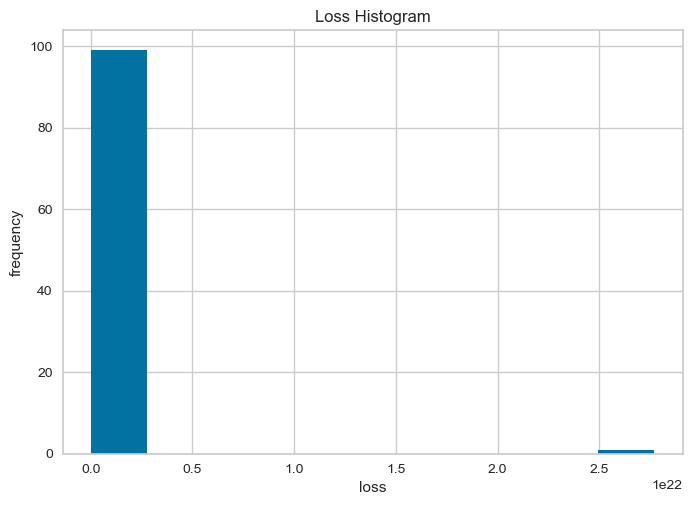

avg best error: 38.65599966876912


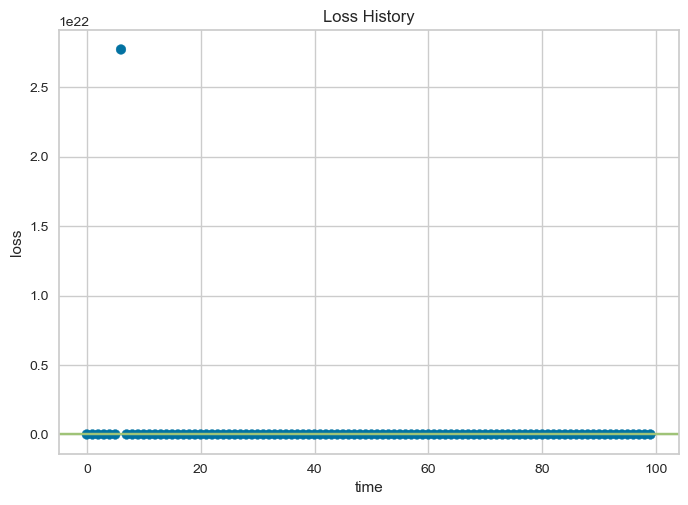

In [56]:
# Generate a histogram plot of the trials
plotting.main_plot_histogram(atpe_trials)

# Generate a history plot of the trials
plotting.main_plot_history(atpe_trials)

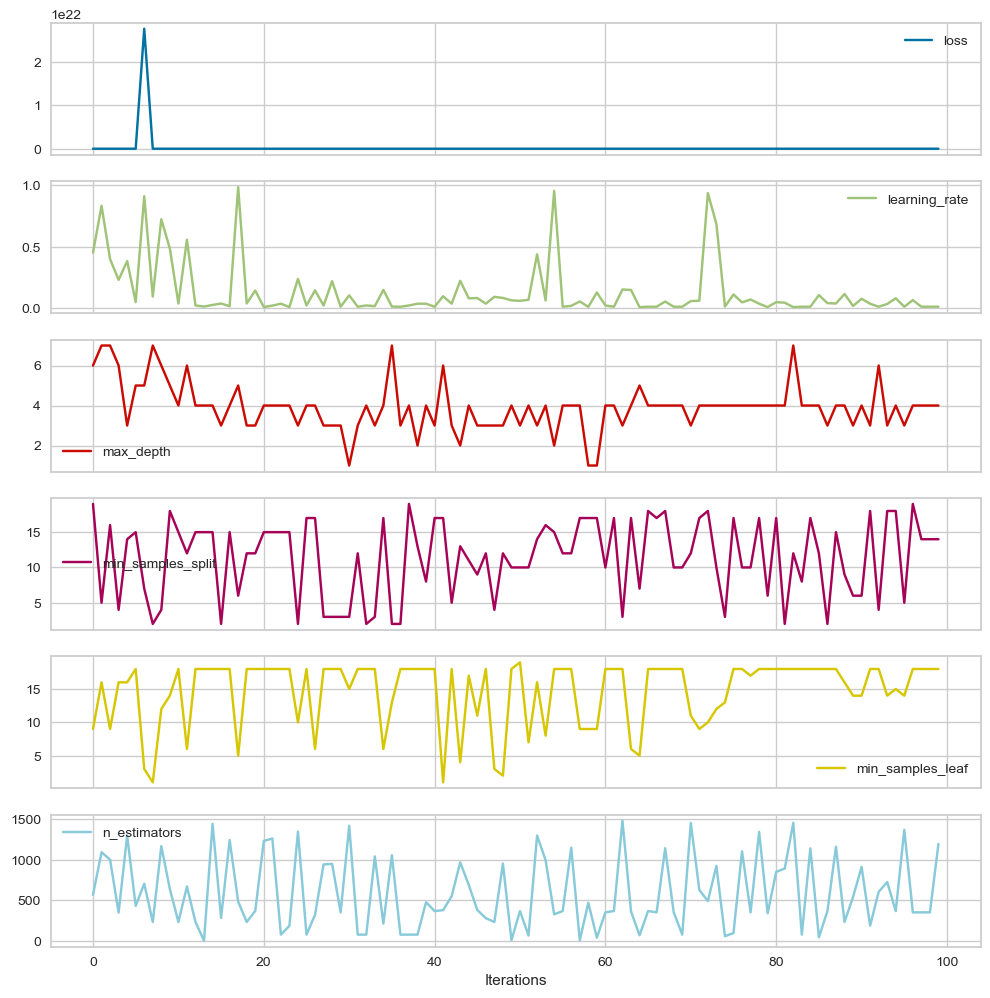

In [57]:
# Extract relevant information from the trials and create a numpy array
plotting_data = np.array([[x["result"]["loss"],
                           x["misc"]["vals"]["learning_rate"][0],
                           x["misc"]["vals"]["max_depth"][0],
                           x["misc"]["vals"]["min_samples_split"][0],
                           x["misc"]["vals"]["min_samples_leaf"][0],
                           x["misc"]["vals"]["n_estimators"][0],
                           ] for x in atpe_trials.trials])

# Create a DataFrame from the numpy array with appropriate column names
plotting_data = pd.DataFrame(plotting_data,
                             columns=["loss", "learning_rate", "max_depth", "min_samples_split",
                                      "min_samples_leaf", "n_estimators"])

# Plot the DataFrame as subplots
plotting_data.plot(subplots=True, figsize=(12, 12))
plt.xlabel("Iterations")
plt.show()

In [58]:
# Create the pipeline with preprocessors and the regressor
model = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(**atpe_best, random_state=42))
])

# Fit the model on the training data
model.fit(X_train, y_train)

# Evaluate the model on the test and train data
print("Test score is: ", model.score(X_test, y_test))
print("Train score is: ", model.score(X_train, y_train))

Test score is:  0.4378586988827824
Train score is:  0.5566204126212811


In [59]:
param_grid = {
        "regressor__max_depth": hp.randint('max_depth', 1, 10),
        "regressor__learning_rate": hp.uniform('learning_rate', 0.01, 1),
        "regressor__n_estimators":100 + hp.randint("n_estimators", 1200), 
        "regressor__subsample": hp.uniform('subsample', 0.01, 1),
         "regressor__min_samples_split":  hp.randint("min_samples_split", 2, 20),
        "regressor__min_samples_leaf" :  hp.randint("min_samples_leaf", 1, 20)
    }
# Create a pipeline with the preprocessors and GradientBoostingRegressor
pipe = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(random_state=42))
])

# Define the ShuffleSplit and KFold for cross-validation
shuffle = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create Trials object to store the results
anneal_trials = Trials()

# Perform hyperparameter optimization using Annealing
anneal_best = fmin(
    objective,
    space=param_grid,
    algo=anneal.suggest,
    max_evals=100,
    rstate=np.random.default_rng(42),
    trials=anneal_trials
)

# Print the best hyperparameters obtained
print(anneal_best)

100%|█████████| 100/100 [02:24<00:00,  1.44s/trial, best loss: 39.128787422174774]
{'learning_rate': 0.21560960359739711, 'max_depth': 1, 'min_samples_leaf': 6, 'min_samples_split': 11, 'n_estimators': 91, 'subsample': 0.7640700993882603}


Showing Histogram of 100 jobs


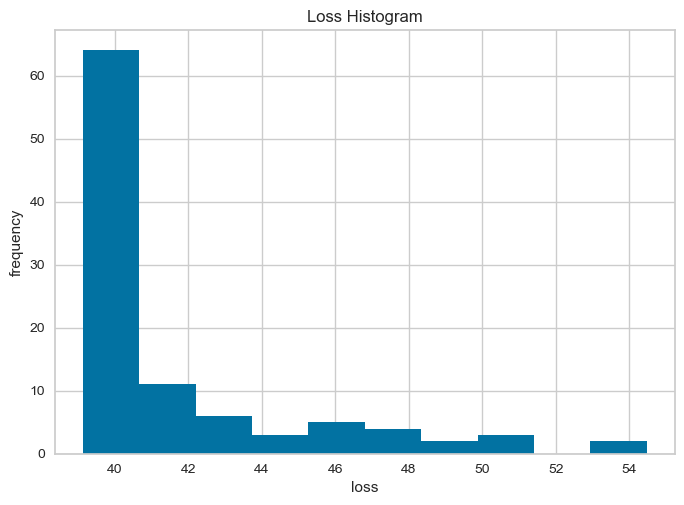

avg best error: 39.128787422174774


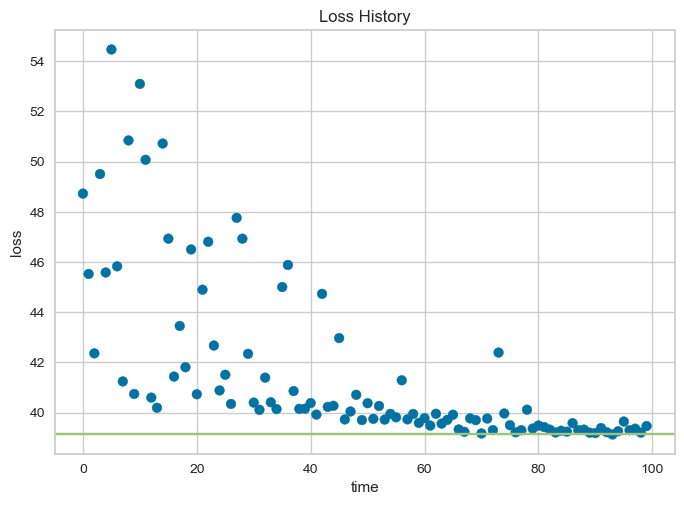

finite loss range 39.128787422174774 54.47175577217623 38.128787422174774


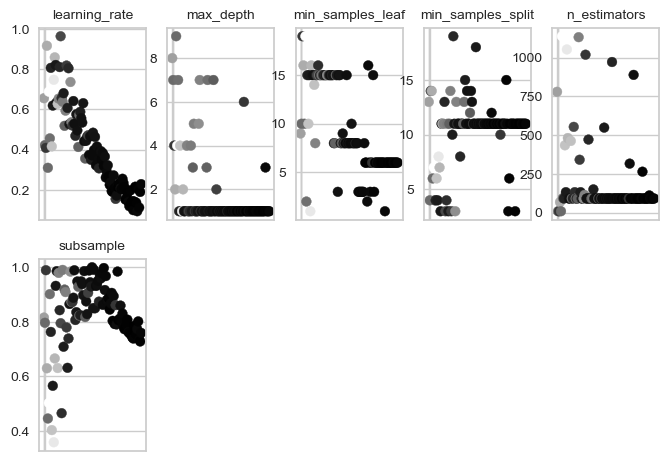

In [60]:
# Plot histogram
plotting.main_plot_histogram(anneal_trials)

# Plot history
plotting.main_plot_history(anneal_trials)

# Plot variables
plotting.main_plot_vars(anneal_trials)


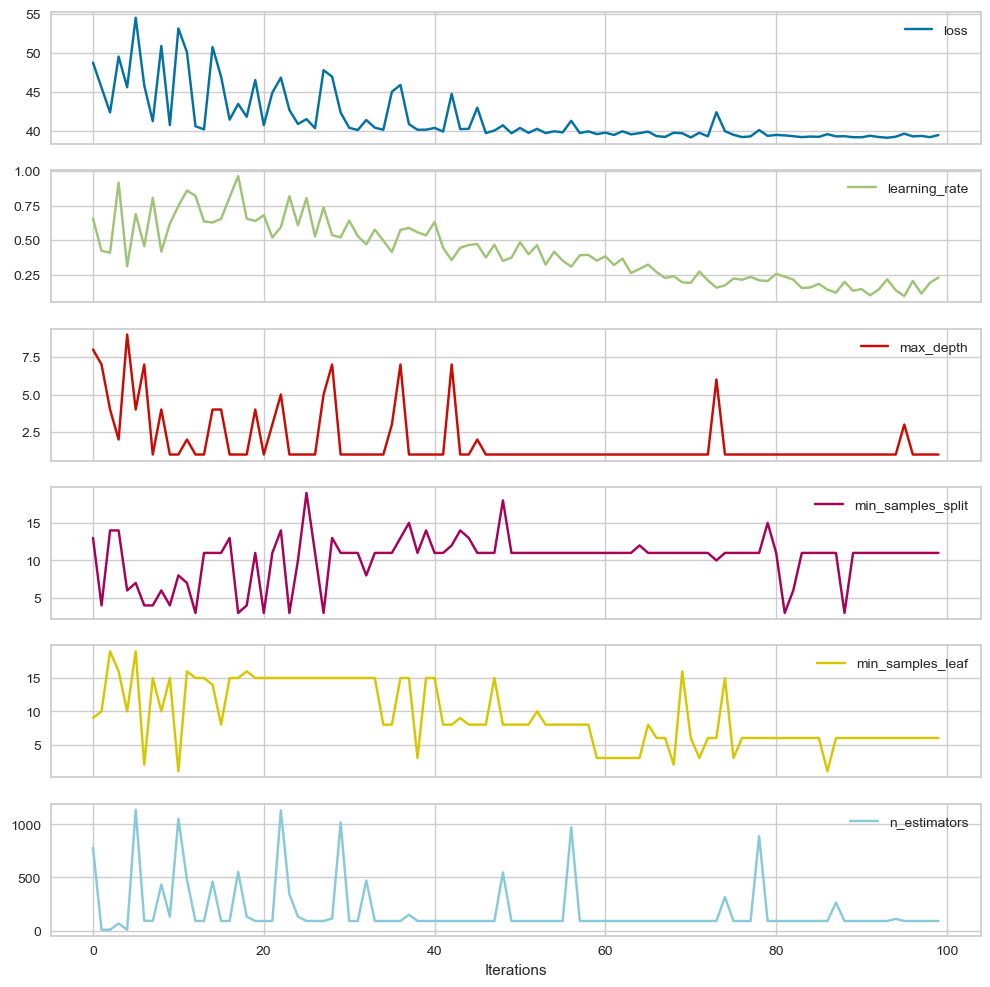

In [61]:
# Extract the relevant data from anneal_trials and create a numpy array
plotting_data = np.array([
    [
        x["result"]["loss"],
        x["misc"]["vals"]["learning_rate"][0],
        x["misc"]["vals"]["max_depth"][0],
        x["misc"]["vals"]["min_samples_split"][0],
        x["misc"]["vals"]["min_samples_leaf"][0],
        x["misc"]["vals"]["n_estimators"][0],
    ] for x in anneal_trials.trials
])

# Create a DataFrame using the plotting_data array and assign column names
plotting_data = pd.DataFrame(
    plotting_data,
    columns=["loss", "learning_rate", "max_depth", "min_samples_split", "min_samples_leaf", "n_estimators"]
)

# Plot the subplots using the DataFrame
plotting_data.plot(subplots=True, figsize=(12, 12))
plt.xlabel("Iterations")
plt.show()

In [62]:
# Create a pipeline with preprocessors and a GradientBoostingRegressor
model = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(**anneal_best, random_state=42))
])

# Fit the pipeline on the training data
model.fit(X_train, y_train)

# Evaluate the model's performance on the test and train datasets
print("Test score is:", model.score(X_test, y_test))
print("Train score is:", model.score(X_train, y_train))


Test score is: 0.4479750364028482
Train score is: 0.4666401013048811


<a id="fp"></a>
#### <span style="color:#33afff  ;"> Gradient Boosting Regression  Optimization With Optuna</span>

In [63]:
def objective(trial):
    """
    Objective function for Optuna hyperparameter optimization.
    
    Args:
        trial (optuna.Trial): A trial object that stores the hyperparameters to be evaluated.
        
    Returns:
        float: Mean R^2 score obtained by performing cross-validation.
    """
    # Define the hyperparameters to be tuned
    n_estimators = trial.suggest_int("n_estimators", 100, 1200)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 1)
    subsample = trial.suggest_float('subsample', 0.1, 1)
    max_depth = trial.suggest_int('max_depth', 1, 10)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 10)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10)
    loss = trial.suggest_categorical('loss', ['absolute_error', 'squared_error', 'huber', 'quantile'])
    
    # Update the regressor parameters based on the trial suggestions
    gradient_pipe.set_params(
        regressor__n_estimators=n_estimators,
        regressor__learning_rate=learning_rate,
        regressor__subsample=subsample,
        regressor__max_depth=max_depth,
        regressor__min_samples_split=min_samples_split,
        regressor__min_samples_leaf=min_samples_leaf,
        regressor__loss=loss
    )
    
    # Perform cross-validation and return the mean R^2 score
    return cross_val_score(gradient_pipe, X_train, y_train, n_jobs=-1, cv=kf, scoring='r2').mean() 

In [64]:
# Create the pipeline with preprocessors and the regressor
xgb_pipe = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(random_state=42))
])

shuffle = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Create an Optuna study object
study_gbr = optuna.create_study(direction='maximize')

# Run the optimization process using the objective function for a maximum of 200 trials
study_gbr.optimize(objective, n_trials=200)

[I 2023-05-19 14:57:59,910] A new study created in memory with name: no-name-fecc11aa-47a4-4185-9dbb-e1f9a93b6f35
[I 2023-05-19 14:58:04,533] Trial 0 finished with value: 0.26112736275138004 and parameters: {'n_estimators': 1167, 'learning_rate': 0.03311498279240444, 'subsample': 0.6092161146324352, 'max_depth': 5, 'min_samples_split': 8, 'min_samples_leaf': 1, 'loss': 'squared_error'}. Best is trial 0 with value: 0.26112736275138004.
[I 2023-05-19 14:58:05,060] Trial 1 finished with value: -0.10824092268265732 and parameters: {'n_estimators': 432, 'learning_rate': 0.4251535985109056, 'subsample': 0.10409670666017853, 'max_depth': 1, 'min_samples_split': 5, 'min_samples_leaf': 1, 'loss': 'squared_error'}. Best is trial 0 with value: 0.26112736275138004.
[I 2023-05-19 14:58:08,559] Trial 2 finished with value: -5.310755498256749e+17 and parameters: {'n_estimators': 1090, 'learning_rate': 0.872501614853059, 'subsample': 0.10661943614979719, 'max_depth': 10, 'min_samples_split': 2, 'min_s

In [65]:
trial_gbr = study_gbr.best_trial
trial_gbr.params

{'n_estimators': 260,
 'learning_rate': 0.01173524936554062,
 'subsample': 0.5479618462162902,
 'max_depth': 5,
 'min_samples_split': 6,
 'min_samples_leaf': 2,
 'loss': 'huber'}

In [66]:
# Create the pipeline with preprocessors and the regressor using the best hyperparameters
gradient_pipe = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(**trial_gbr.params, random_state=42))
])

# Fit the pipeline on the training data
gradient_pipe.fit(X_train, y_train)

# Evaluate the pipeline on the test data
score = gradient_pipe.score(X_test, y_test)
score

0.4252390222115421

In [67]:
gradient_pipe.score(X_train, y_train)

0.6553578825883974

In [68]:
trial_gbr = study_gbr.best_trial
print('Root Mean Squared Error: {}'.format(trial_gbr.value))
print("Best Hyperparameters: {}".format(trial_gbr.params))

Root Mean Squared Error: 0.3927755035111563
Best Hyperparameters: {'n_estimators': 260, 'learning_rate': 0.01173524936554062, 'subsample': 0.5479618462162902, 'max_depth': 5, 'min_samples_split': 6, 'min_samples_leaf': 2, 'loss': 'huber'}


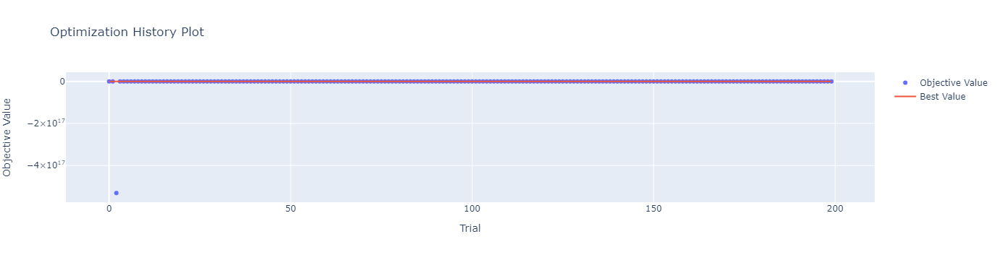

In [69]:
optuna.visualization.plot_optimization_history(study_gbr)

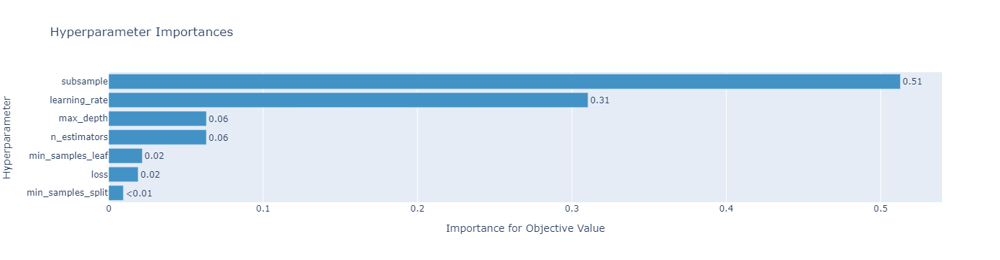

In [70]:
optuna.visualization.plot_param_importances(study_gbr)

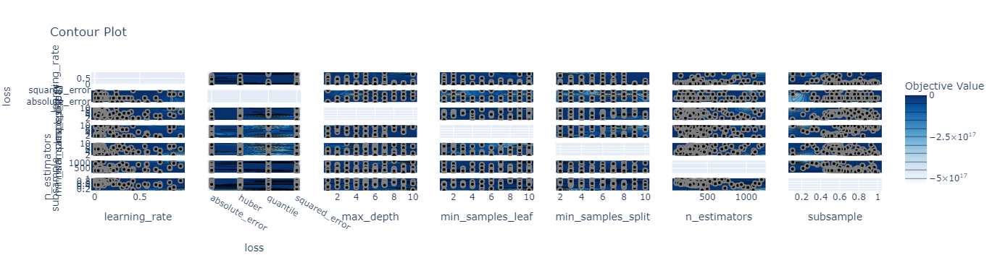

In [71]:
optuna.visualization.plot_contour(study_gbr)

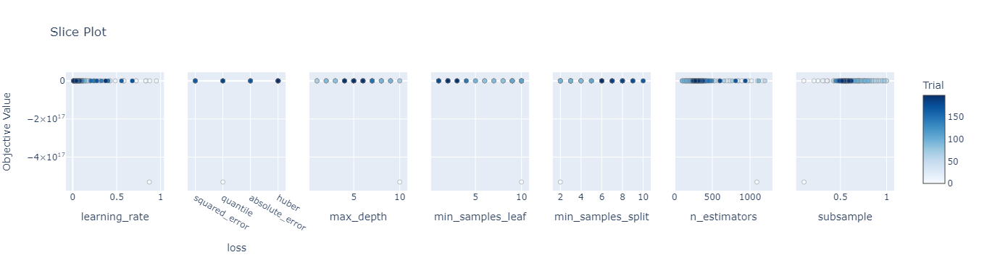

In [72]:
optuna.visualization.plot_slice(study_gbr)

In [73]:
gradient_pipe = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(learning_rate=0.02, max_depth=2, n_estimators=500,
                          random_state=42, subsample=0.9))])

gradient_pipe.fit(X_train, y_train)
gradient_pipe.score(X_test, y_test)

0.4551001246928088

In [74]:
X_train_trans.values

array([[-0.03033142, -2.50813744,  3.68112843, ...,  0.        ,
         0.        ,  0.        ],
       [-0.36452871,  0.63983236, -0.25001826, ...,  1.        ,
         1.        ,  0.        ],
       [-0.05621592, -1.03096102,  0.53621108, ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [ 0.55714372, -1.2696541 ,  0.79828752, ...,  0.        ,
         0.        ,  0.        ],
       [-0.1591684 ,  0.94904859, -0.51209471, ...,  0.        ,
         1.        ,  0.        ],
       [-0.20643041,  0.94904859, -0.51209471, ...,  0.        ,
         0.        ,  0.        ]])

In [83]:
tune_best_params = {'max_depth': 2,
 'learning_rate': 0.09,
 'n_estimators': 100,
 'subsample': 0.9,
 'min_samples_split': 5,
 'min_samples_leaf': 2}

- learning_rate: 0.21560960359739711
- max_depth: 1, 
- min_samples_leaf: 6 
- min_samples_split: 11
- n_estimators: 91
- subsample: 0.7640700993882603

In [81]:
anneal_best

{'learning_rate': 0.21560960359739711,
 'max_depth': 1,
 'min_samples_leaf': 6,
 'min_samples_split': 11,
 'n_estimators': 91,
 'subsample': 0.7640700993882603}

- max_depth: 2,
- learning_rate: 0.09,
- n_estimators: 100,
- subsample: 0.9,
- min_samples_split: 5,
- min_samples_leaf: 2

These two parameters seem to perform better. We choose the aneal best for it socre

In [75]:
grad=GradientBoostingRegressor(learning_rate=0.02, max_depth=2, n_estimators=500,
                          random_state=42, subsample=0.9)

grad.fit(X_train_trans, y_train)
print("Test score is : ", grad.score(X_test_trans, y_test))
print("Train score is : ",grad.score(X_train_trans, y_train))

Test score is :  0.4546176266256101
Train score is :  0.5605615505335236


In [85]:
grad=GradientBoostingRegressor(**anneal_best, random_state=42)

grad.fit(X_train_trans, y_train)
print("Test score is : ", grad.score(X_test_trans, y_test))
print("Train score is : ",grad.score(X_train_trans, y_train))

Test score is :  0.4480206120085719
Train score is :  0.4666759385895468


In [86]:
features= X_test_trans.columns.values.tolist()

# Create LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train_trans.values, mode="regression", feature_names= X_train_trans.columns.values.tolist(),
                                                 class_names=['SiteEnergyUseWN(kBtu)'], verbose=True,)
explainer

In [87]:
j =   np.random.randint(1, len(X_test))
exp = explainer.explain_instance(X_test_trans.values[j], grad.predict, num_features=len(features))

Intercept 188.52912532236238
Prediction_local [8.40315374]
Right: 8.44291047398788


In [88]:
exp.show_in_notebook(show_table=True)

In [89]:
exp.as_list()

[('MainEnergy_NaturalGas <= 0.00', -41.22614864789685),
 ('MainEnergy_Steam <= 0.00', -40.00552955589751),
 ('PrimaryPropertyType_Leisure <= 0.00', -32.30310423628043),
 ('PropertyGFATotal <= -0.54', -17.876525426927007),
 ('PrimaryPropertyType_Supermarket / Grocery Store <= 0.00',
  -17.164794657016895),
 ('0.39 < PrimaryGFAProportion <= 1.02', -8.91814437087506),
 ('PrimaryPropertyType_Warehouse > 0.00', -7.7245249383106875),
 ('-0.56 < LargestPropertyUseTypeGFA <= -0.35', -7.426989691165553),
 ('-0.10 < MeanAgeByPrimaryPropertyType <= -0.06', -4.505278297448624),
 ('BuildingHeight <= -0.51', -4.459863125423992),
 ('-0.44 < SecondLargestPropertyUseTypeGFA <= -0.01', -4.082798345761234),
 ('PrimaryPropertyType_Worship Facility <= 0.00', 3.7881886639924227),
 ('PrimaryPropertyType_Mixed Use Property <= 0.00', -3.1223420569516684),
 ('0.08 < YearBuilt <= 0.82', 2.6640866574335975),
 ('PrimaryPropertyType_Other <= 0.00', 2.1273948978167985),
 ('PrimaryPropertyType_Small- and Mid-Sized Of

In [90]:
explainer = lime_tabular.LimeTabularExplainer(X_train_trans.values, mode="regression", feature_names= X_train_trans.columns.values.tolist(),
                                                 class_names=['SiteEnergyUseWN(kBtu)'], verbose=True,)
explainer

In [91]:
j =  np.random.randint(1, len(X_test))
print("j=", j)
exp = explainer.explain_instance(X_test_trans.values[j], grad.predict, num_features=len(features))

j= 60
Intercept 126.77001880630752
Prediction_local [90.16759807]
Right: 84.23242872878565


In [92]:
from lime import lime_tabular

def explanation_point(model, 
                      features: List[str],
                      X_test: pd.DataFrame,
                      Y_test: pd.DataFrame,
                      idx: int = np.random.randint(1, len(X_test))):
    """
    Generates an explanation for an individual prediction using LimeTabularExplainer.

    Args:
        model: The trained model.
        features: List of feature names.
        X_test: Test data for which the prediction is explained.
        Y_test: Ground truth labels for test data.
        idx: Index of the instance in the test data to explain (default: randomly selected).

    Returns:
        Tuple containing the Lime explanation object, list of feature importance tuples, and the feature importance map.
    """
    # Create LimeTabularExplainer object
    explainer = lime_tabular.LimeTabularExplainer(X_train_trans.values, mode="regression", feature_names=X_train_trans.columns.values.tolist(),
                                                  class_names=['SiteEnergyUseWN(kBtu)'], verbose=True)
    
    explanation = explainer.explain_instance(X_test.values[idx], model.predict, num_features=len(features))
    print("test index:", idx)
    print("Explanation Local Prediction  : ", explanation.local_pred[0])
    print("Explanation Global Prediction : ", explanation.predicted_value)
    explanation.show_in_notebook()
    
    with plt.style.context("ggplot"):
        explanation.as_pyplot_figure()
    explanation.as_list()
    explanation.save_to_file("gradient_explanation.html")
    
    return explanation, explanation.as_list(), explanation.as_map()


Intercept 181.34724360516265
Prediction_local [18.37886298]
Right: 18.53288694558775
test index: 25
Explanation Local Prediction  :  18.37886297574653
Explanation Global Prediction :  18.53288694558775


(<lime.explanation.Explanation at 0x214789256f0>,
 [('MainEnergy_Steam <= 0.00', -40.950212771938574),
  ('MainEnergy_NaturalGas <= 0.00', -40.934942967340135),
  ('PrimaryPropertyType_Leisure <= 0.00', -31.46552541070785),
  ('PropertyGFATotal <= -0.54', -17.411587039945186),
  ('PrimaryPropertyType_Supermarket / Grocery Store <= 0.00',
   -17.305892922169104),
  ('-0.06 < MeanAgeByPrimaryPropertyType <= 0.69', -8.368027239188988),
  ('PrimaryPropertyType_Warehouse <= 0.00', 7.960771444591743),
  ('LargestPropertyUseTypeGFA <= -0.56', -6.8328894764522285),
  ('GFAPerFloor <= -0.58', -6.80555497182691),
  ('-0.25 < BuildingHeight <= 0.27', -3.7893842135023097),
  ('-0.44 < SecondLargestPropertyUseTypeGFA <= -0.01', -2.9305802287596747),
  ('PrimaryPropertyType_Worship Facility <= 0.00', 2.531558701337362),
  ('PrimaryPropertyType_Mixed Use Property <= 0.00', -2.296354015896466),
  ('0.08 < YearBuilt <= 0.82', 2.0379971393874583),
  ('-1.21 < PrimaryGFAProportion <= 0.39', 1.94427825898

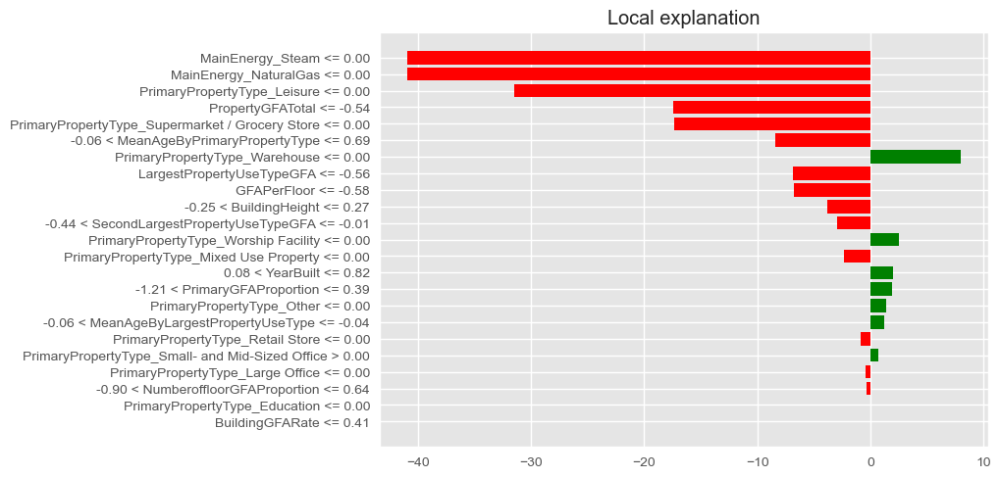

In [93]:
explanation_point(grad, features, X_test_trans, y_test_trans, idx = 25)

Intercept 200.1566834868064

Prediction_local [39.02237988]

Right: 39.486726656942096

test index: 8

Explanation Local Prediction  :  [39.02237988]

Explanation Global Prediction :  39.486726656942096

In [94]:
shap.initjs()
grad_explainer = shap.TreeExplainer(grad, X_train_trans, feature_names=features)
grad_explainer

In [99]:
def embedding_plot(model_explainer: Any, features: List[str], X_test: np.ndarray) -> None:
    """
    Generate embedding plots for the given features using the provided model explainer.

    Args:
        model_explainer (Any): The SHAP model explainer object with a shap_values method.
        features (List[str]): List of feature names for which embedding plots will be generated.
        X_test (np.ndarray): Test dataset used for generating embedding plots.

    Returns:
        None: Displays the embedding plots.

    """
    for feature in features:
        shap.embedding_plot(
            feature,
            model_explainer.shap_values(X_test),
            feature_names=features
        )

In [100]:
def partial_dependence_plot(model: Any, features: List[str], X_train: np.ndarray) -> None:
    """
    Generate partial dependence plots for the given features using the provided model.

    Args:
        model (Any): The trained model object with a predict method.
        features (List[str]): List of feature names for which partial dependence plots will be generated.
        X_train (np.ndarray): Training dataset used for generating partial dependence plots.

    Returns:
        None: Displays the partial dependence plots.

    """
    for feature in features:
        shap.plots.partial_dependence(
            feature,
            model.predict,
            X_train,
            ice=False,
            model_expected_value=True,
            feature_expected_value=True
        )

In [101]:
print("Explanation Local Prediction  : ", exp.local_pred)
print("Explanation Global Prediction : ", exp.predicted_value)

Explanation Local Prediction  :  [90.16759807]
Explanation Global Prediction :  84.23242872878565


In [102]:
grad_explainer = shap.TreeExplainer(grad, X_train_trans, feature_names=features)
grad_explainer

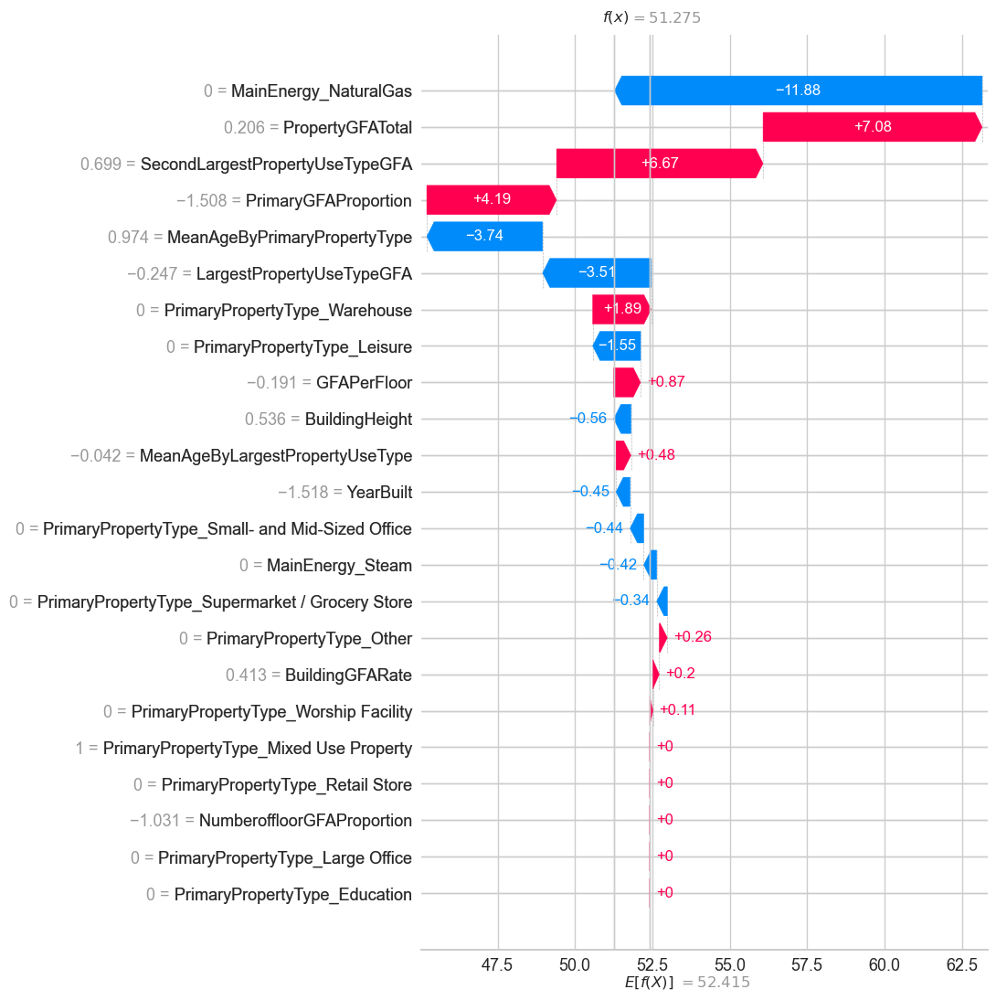

In [103]:
shap_values = grad_explainer(X_test_trans[:1])
shap_values.feature_names = features

shap.waterfall_plot(shap_values[0], max_display=len(features))

In [105]:
shap.force_plot(grad_explainer.expected_value,
                grad_explainer.shap_values(X_test_trans[:1]),
                feature_names=features,
                out_names="CO2 Emissionx")

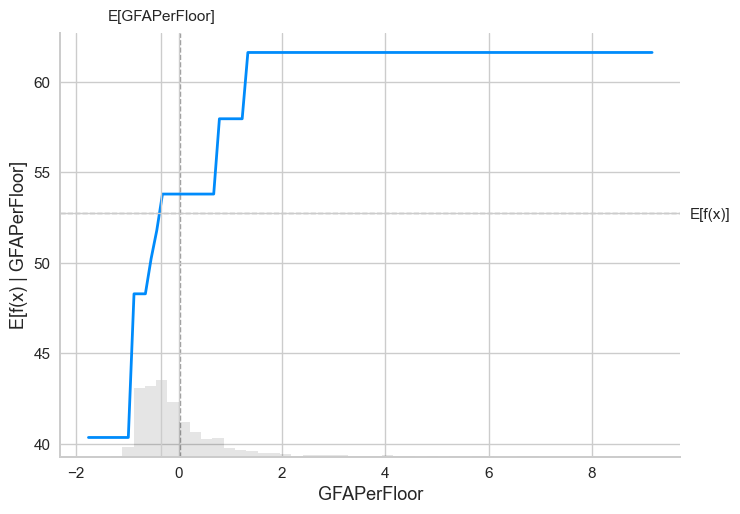

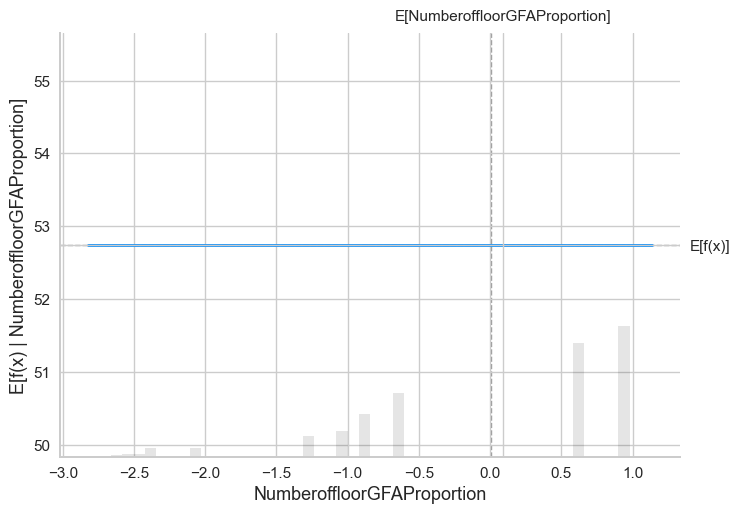

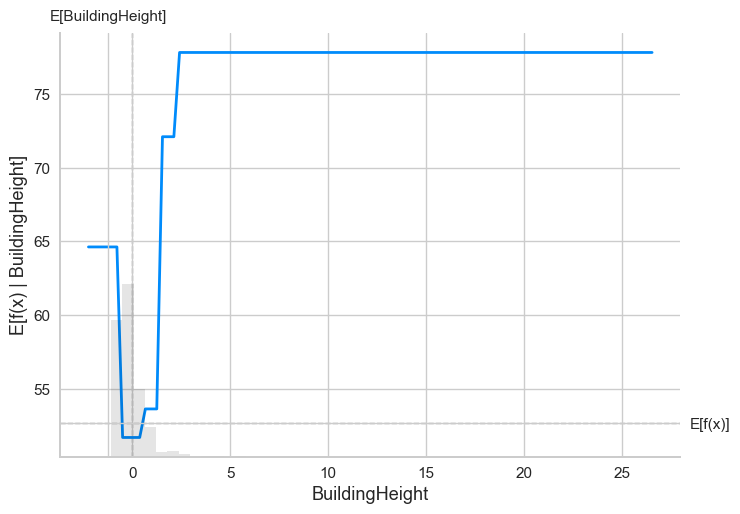

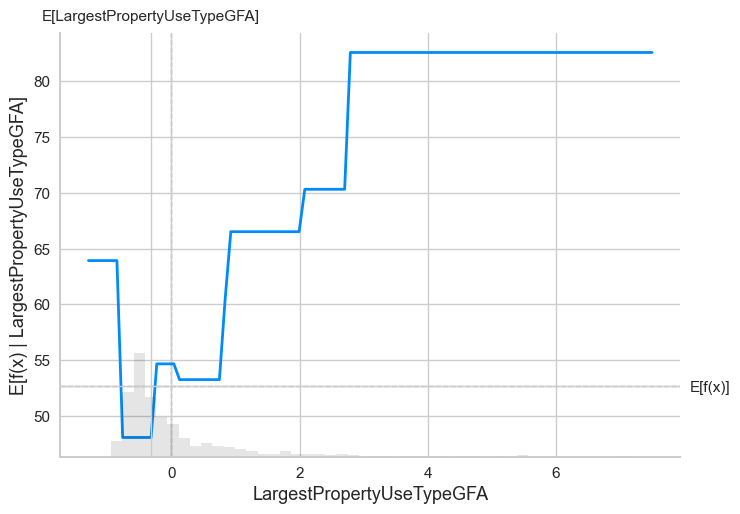

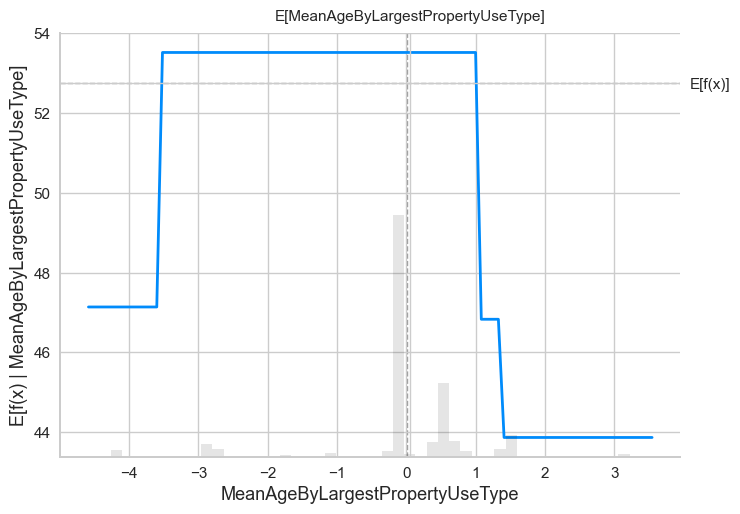

...

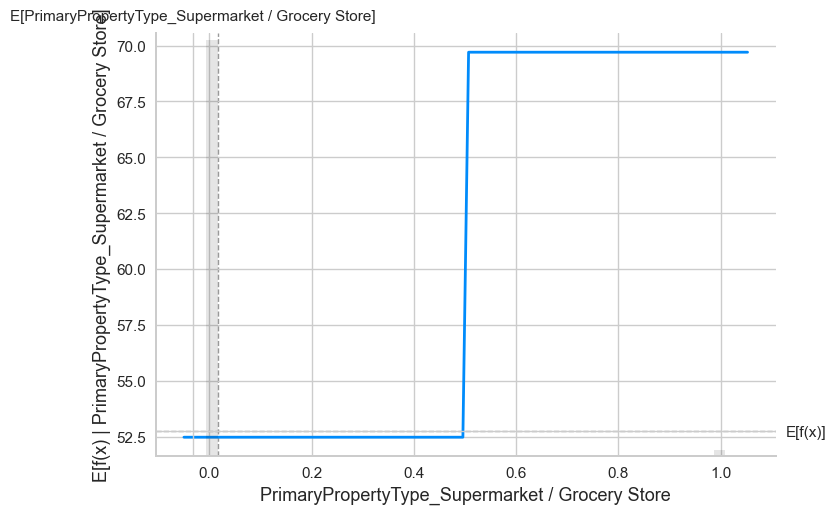

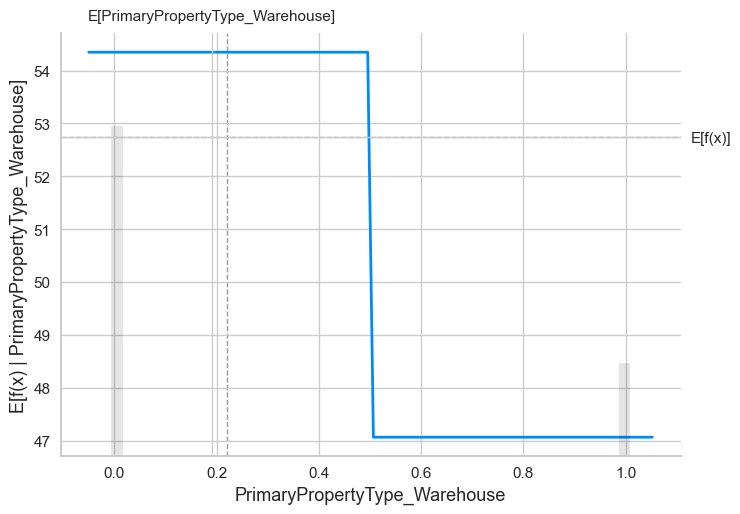

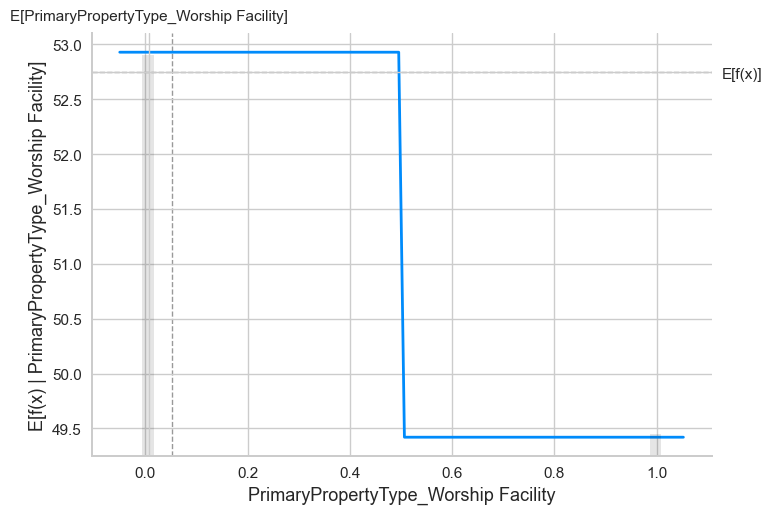

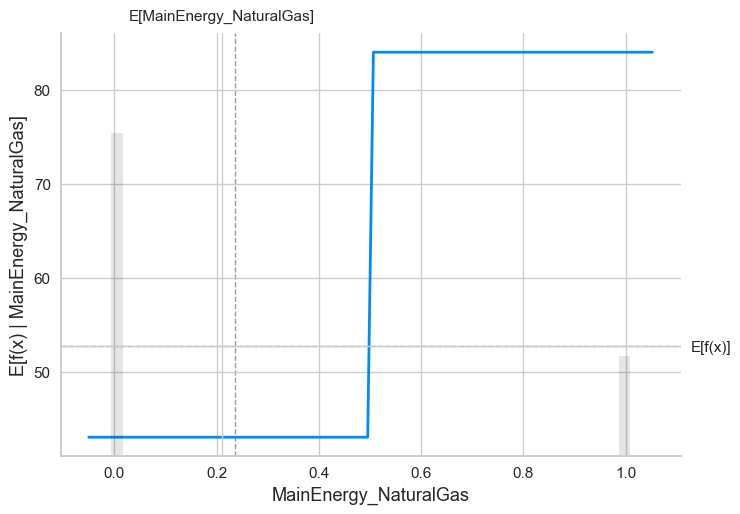

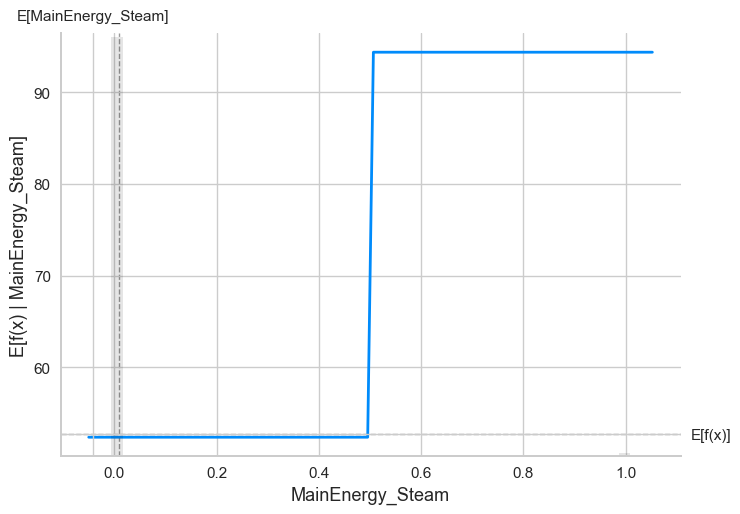

In [106]:
partial_dependence_plot(grad, features, X_train_trans)

<a id="dp"></a>

# <h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" >Features Importance</h1>

<a id="fp"></a>
## <span style="color:#33afff  ;"> Features Importance With ENERGYSTARSCORE imputed</span>

In [107]:
# Define the selected features
selected_features = ['ENERGYSTARScore','GFAPerFloor', 'PrimaryPropertyType', 'NumberoffloorGFAProportion', 
                     'MainEnergy','BuildingHeight','LargestPropertyUseTypeGFA', 'MeanAgeByLargestPropertyUseType',
                     'YearBuilt', 'MeanAgeByPrimaryPropertyType','SecondLargestPropertyUseTypeGFA','PrimaryGFAProportion',
                     'BuildingGFARate', 'PropertyGFATotal']

# Define the target variable
target = 'TotalGHGEmissions'

# Subset the data based on selected features and target
df_ess_imp = data[selected_features]
y_ess_imp = data[target]

# Split the data into training and test sets
X_train_ess_imp, X_test_ess_imp, y_train_ess_imp, y_test_ess_imp = train_test_split(df_ess_imp, y_ess_imp,
                                                                                    test_size=0.2, random_state=42)

# Perform data preprocessing
X_train_ess_imp_trans = preprocessing(X_train_ess_imp)
X_test_ess_imp_trans = preprocessing(X_test_ess_imp)

# Print the shapes of the train and test sets
print("The train set shape is {}".format(X_train.shape))
print("The test set shape is {}".format(X_test.shape))

# Iterate over the models and perform model testing
for model_name, model in models.items():
    print(model_name)
    model_testing(df_ess_imp, y_ess_imp, y_train_ess_imp, y_test_ess_imp, X_train_ess_imp, X_test_ess_imp, model)


The train set shape is (942, 13)
The test set shape is (236, 13)
Random Forest Regressor
The train score is: 0.9132241931875542
Model score: 0.485
MAE:  26.36766
MSE:  1290.81219
RMSE:  35.9278747723495
MAPE:  1.10763
R²:  0.4849
Gradient Boosting Regressor
The train score is: 0.710123639571439
Model score: 0.465
MAE:  26.55528
MSE:  1341.84927
RMSE:  36.631260834888316
MAPE:  1.0473
R²:  0.46453
Lasso
The train score is: 0.37677360519134073
Model score: 0.403
MAE:  29.55639
MSE:  1495.05348
RMSE:  38.66592138074336
MAPE:  1.46516
R²:  0.40339
LassoCV
The train score is: 0.4369387227951531
Model score: 0.445
MAE:  28.27494
MSE:  1389.89367
RMSE:  37.28127771255289
MAPE:  1.23534
R²:  0.44536
LassoLarsCV
The train score is: 0.43691422869480445
Model score: 0.445
MAE:  28.27518
MSE:  1389.88593
RMSE:  37.281173992794976
MAPE:  1.23557
R²:  0.44536
Ridge
The train score is: 0.43717992197553035
Model score: 0.444
MAE:  28.32663
MSE:  1394.46472
RMSE:  37.342532365110934
MAPE:  1.23532
R²: 

In [108]:
# Define the categorical and numerical columns
CATEGORICAL = df_ess_imp.select_dtypes(include='object').columns
NUMERICAL = df_ess_imp.select_dtypes(include="number").columns

# Define the numerical pipeline
numerical_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', RobustScaler())
])

# Define the categorical pipeline
categorical_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
])

# Define the column transformer
preprocessors = ColumnTransformer(transformers=[
    ('num', numerical_pipe, NUMERICAL),
    ('cat', categorical_pipe, CATEGORICAL)
])


In [109]:
modelling(df_ess_imp, selected_features, estimators, X_train_ess_imp, X_test_ess_imp, y_train_ess_imp, y_test_ess_imp)

*************************************************************************************
                                        Dummy Regressor                                          
*************************************************************************************
Dummy Regressor
The train score is: 0.0
The test score is: -3.124476329707804e-05
MAE = 38.42029
MSE = 2506.00247
RMSE = 50.05999
MAPE = 2.63901
R² = -3e-05
*************************************************************************************
                                        Elastic Net                                          
*************************************************************************************
Elastic Net
The train score is: 0.24807641501957356
The test score is: 0.2740849473719179
MAE = 32.12096
MSE = 1819.08807
RMSE = 42.65077
MAPE = 2.00109
R² = 0.27408
*************************************************************************************
                                        SVR            

,Dummy Regressor,Elastic Net,SVR,Random Forest Regressor,Extra Tree Regressor,Gradient Boosting Regressor,KNeighbors Regressor,Linear Regression,Decision Tree Regressor,XGB Regressor,Lasso,LassoCV,LassoLarsCV,Ridge,SGD Regressor,AdaBoost Regressor
R²,-0.0000,0.2741,-0.0470,0.4849,0.4267,0.4645,0.2582,0.4442,0.0021,0.4077,0.4034,0.4454,0.4454,0.4435,-1.656947e+13,0.0625
MAE,38.4203,32.1210,34.5142,26.3677,27.3968,26.5553,30.7597,28.2831,33.8987,27.4660,29.5564,28.2749,28.2752,28.3266,1.270947e+08,42.2354
RMSE,50.0600,42.6508,51.2231,35.9279,37.9035,36.6313,43.1139,37.3215,50.0056,38.5250,38.6659,37.2813,37.2812,37.3425,2.037691e+08,48.4688
MAPE,2.6390,2.0011,1.6207,1.1076,1.0838,1.0473,1.1791,1.2243,1.1744,1.0644,1.4652,1.2353,1.2356,1.2353,6.268293e+06,3.1754


In [110]:
model_pipe_ess_imp = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(random_state=42))])

model_params = { 'Random Forest Regressor': rfr_grid, 
               'Gradient Boosting Regressor':gbr_grid,
                                 }

In [111]:
tuning_model = 'GridSearchCV'
searchCV_ess_imp, score_table_ess_imp = search_tuning(model_pipe_ess_imp, X_train_ess_imp,
                                      X_test_ess_imp, y_train_ess_imp,
                                      y_test_ess_imp, model_params, 
                                      kf, tuning_model)

*************************************************************************************
                Proceding GridSearchCV for Random Forest Regressor...                
*************************************************************************************
Fitting 5 folds for each of 165 candidates, totalling 825 fits

Best GridSearchCV hyperparameters for Random Forest Regressor:
max_depth: 15
max_features: log2
n_estimators: 2000
_________________________________________________________________________________________________________
 Mean cross-validated score of the best estimator for Random Forest Regressor: R² = 0.399 ± 0.063 
_________________________________________________________________________________________________________
*************************************************************************************
              Proceding GridSearchCV for Gradient Boosting Regressor...              
********************************************************************************

In [112]:
grid_best_model_ess_imp = get_best_model(searchCV_ess_imp)
grid_best_model_ess_imp


The overall best cross-validated score is: R² = 0.402
The best model is Gradient Boosting Regressor with parameters:
  - learning_rate: 0.01
  - max_depth: 2
  - n_estimators: 1000
  - subsample: 0.3


Pipeline(steps=[('preprocessors',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  Index(['ENERGYSTARScore', 'GFAPerFloor', 'NumberoffloorGFAProportion',
       'BuildingHeight', 'LargestPropertyUseTypeGFA',
       'MeanAgeByLargestPropertyUseType', 'YearBuilt',
       'MeanAgeByPrimaryPropertyType', 'SecondLargestPr...
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['PrimaryPropertyType', 'MainEnergy'], dtype='object'))])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.01, max_depth=2,
                                           n_estimators=1000, random_state=42,
                                           subsample=0.3))])

In [113]:
# Evaluate the model's performance on the test data
print("Test score is:", grid_best_model_ess_imp.score(X_test_ess_imp, y_test_ess_imp))

# Evaluate the model's performance on the training data
print("Train score is:", grid_best_model_ess_imp.score(X_train_ess_imp, y_train_ess_imp))

Test score is: 0.5095601918761858
Train score is: 0.5638320415924298


In [114]:
def objective(space):
    """
    Objective function for hyperparameter optimization using Bayesian optimization.

    Args:
        space (dict): Hyperparameter configuration space.

    Returns:
        Dictionary containing the loss (negative RMSE) and status.

    """
    shuffle = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)  # ShuffleSplit for cross-validation
    kfold = KFold(n_splits=10, shuffle=True, random_state=42)  # KFold for cross-validation
    estimator_clone = clone(pipe).set_params(**space)  # Create a clone of the pipeline with hyperparameters set
    scores = cross_val_score(estimator_clone, X_train_ess_imp, y_train_ess_imp, cv=kfold,
                             scoring='neg_root_mean_squared_error', n_jobs=-1)  # Perform cross-validation
    loss = -1 * np.mean(scores)  # Calculate the negative mean RMSE loss
    return {'loss': loss, 'status': STATUS_OK}

In [115]:
# Define the search space for hyperparameters
param_grid = {
    "regressor__max_depth": hp.randint('max_depth', 1, 8),
    "regressor__learning_rate": hp.uniform('learning_rate', 0.01, 1),
    "regressor__n_estimators": 100 + hp.randint("n_estimators", 1500),
    "regressor__subsample": hp.uniform('subsample', 0.01, 1),
    "regressor__min_samples_split": hp.randint("min_samples_split", 2, 40),
    "regressor__min_samples_leaf": hp.randint("min_samples_leaf", 1, 40)
}

# Define the pipeline with preprocessors and a GradientBoostingRegressor
model_pipe_ess_imp = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(random_state=42))
])

shuffle = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)  # ShuffleSplit for cross-validation

tpe_trials = Trials()  # Create an instance of Trials to track the optimization process

# Perform hyperparameter optimization using TPE algorithm
best = fmin(objective,
            space=param_grid,
            algo=tpe.suggest,
            max_evals=200,
            rstate=np.random.default_rng(42),
            trials=tpe_trials)

print(best)  # Print the best hyperparameters found during optimization

100%|██████████| 200/200 [13:46<00:00,  4.13s/trial, best loss: 38.45918700585671]
{'learning_rate': 0.030417515403627086, 'max_depth': 2, 'min_samples_leaf': 4, 'min_samples_split': 27, 'n_estimators': 398, 'subsample': 0.401399065584351}


In [116]:
# Create a pipeline with preprocessors and a GradientBoostingRegressor using the best hyperparameters
model = Pipeline([
    ('preprocessors', preprocessors),
    ('regressor', GradientBoostingRegressor(**best, random_state=42))
])

# Fit the model on the training data
model.fit(X_train_ess_imp, y_train_ess_imp)

# Evaluate the model's performance on the test data
test_score = model.score(X_test_ess_imp, y_test_ess_imp)
print("Test score is:", test_score)

# Evaluate the model's performance on the training data
train_score = model.score(X_train_ess_imp, y_train_ess_imp)
print("Train score is:", train_score)

Test score is: 0.48643226569081244
Train score is: 0.5709918282006028


<a id="fp"></a>
## <span style="color:#33afff  ;"> Features Importance With ENERGYSTARSCORE</span>

In [117]:
selected_features = ['ENERGYSTARScore','GFAPerFloor', 'PrimaryPropertyType', 'NumberoffloorGFAProportion', 
                     'MainEnergy','BuildingHeight','LargestPropertyUseTypeGFA', 'MeanAgeByLargestPropertyUseType',
                     'YearBuilt', 'MeanAgeByPrimaryPropertyType','SecondLargestPropertyUseTypeGFA','PrimaryGFAProportion',
                     'BuildingGFARate', 'PropertyGFATotal']

# Set the target variable
target = 'TotalGHGEmissions'

# Subset the data based on selected features and target
df_ess_imp = data[selected_features]

# Create a copy of the data and drop rows with missing ENERGYSTARScore
df = data.copy()
df = df.dropna(subset=['ENERGYSTARScore'])

# Subset the essential features and target from the cleaned data
df_ess = df[selected_features]
y_ess = df[target]

# Split the data into training and test sets
X_train_ess, X_test_ess, y_train_ess, y_test_ess = train_test_split(df_ess, y_ess, test_size=0.2, random_state=42)

# Perform data preprocessing
X_train_ess_trans = preprocessing(X_train_ess)
X_test_ess_trans = preprocessing(X_test_ess)

# Print the shapes of the train and test sets
print("The train set shape is {}".format(X_train_ess.shape))
print("The test set shape is {}".format(X_test_ess.shape))

# Iterate over the models and perform model testing
for model_name, model in models.items():
    print(model_name)
    model_testing(df_ess, y_ess, y_train_ess, y_test_ess, X_train_ess, X_test_ess, model)


The train set shape is (614, 14)
The test set shape is (154, 14)
Random Forest Regressor
The train score is: 0.9297078756764241
Model score: 0.523
MAE:  25.04819
MSE:  1257.571
RMSE:  35.46224753315548
MAPE:  3504218701488216.5
R²:  0.52335
Gradient Boosting Regressor
The train score is: 0.8288643898699138
Model score: 0.562
MAE:  24.14897
MSE:  1155.43772
RMSE:  33.991730141916385
MAPE:  3248622659003150.5
R²:  0.56206
Lasso
The train score is: 0.46319071182069305
Model score: 0.404
MAE:  28.84182
MSE:  1571.9781
RMSE:  39.64817908231624
MAPE:  2609495636692012.5
R²:  0.40418
LassoCV
The train score is: 0.5189453783989975
Model score: 0.451
MAE:  27.41832
MSE:  1447.84702
RMSE:  38.050584972747735
MAPE:  3370293232668401.5
R²:  0.45123
LassoLarsCV
The train score is: 0.532124817201846
Model score: 0.463
MAE:  26.95889
MSE:  1416.31949
RMSE:  37.6340204176022
MAPE:  3582193996238128.0
R²:  0.46318
Ridge
The train score is: 0.543038328674175
Model score: 0.464
MAE:  26.98903
MSE:  1413.

In [118]:
# Define the categorical and numerical columns
CATEGORICAL = df_ess.select_dtypes(include='object').columns
NUMERICAL = df_ess.select_dtypes(include="number").columns

# Define the numerical pipeline
numerical_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', RobustScaler())
])

# Define the categorical pipeline
categorical_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
])

# Define the column transformer
preprocessors = ColumnTransformer(transformers=[
    ('num', numerical_pipe, NUMERICAL),
    ('cat', categorical_pipe, CATEGORICAL)
])


In [119]:
modelling(df_ess, selected_features, estimators, X_train_ess, X_test_ess, y_train_ess, y_test_ess)

*************************************************************************************
                                        Dummy Regressor                                          
*************************************************************************************
Dummy Regressor
The train score is: 0.0
The test score is: -0.002238609480892384
MAE = 39.61696
MSE = 2644.25811
RMSE = 51.42235
MAPE = 1539269349521711.0
R² = -0.00224
*************************************************************************************
                                        Elastic Net                                          
*************************************************************************************
Elastic Net
The train score is: 0.3110350345885109
The test score is: 0.3117706391274716
MAE = 32.39106
MSE = 1815.79122
RMSE = 42.6121
MAPE = 2490013997191095.5
R² = 0.31177
*************************************************************************************
                                  

,Dummy Regressor,Elastic Net,SVR,Random Forest Regressor,Extra Tree Regressor,Gradient Boosting Regressor,KNeighbors Regressor,Linear Regression,Decision Tree Regressor,XGB Regressor,Lasso,LassoCV,LassoLarsCV,Ridge,SGD Regressor,AdaBoost Regressor
R²,-2.200000e-03,3.118000e-01,-1.357000e-01,5.233000e-01,5.635000e-01,5.621000e-01,3.028000e-01,4.598000e-01,1.146000e-01,4.985000e-01,4.042000e-01,4.512000e-01,4.632000e-01,4.641000e-01,-6.530232e+20,2.528000e-01
MAE,3.961700e+01,3.239110e+01,3.871280e+01,2.504820e+01,2.408600e+01,2.414900e+01,3.050040e+01,2.699100e+01,3.289610e+01,2.614830e+01,2.884180e+01,2.741830e+01,2.695890e+01,2.698900e+01,6.428563e+11,3.720060e+01
RMSE,5.142240e+01,4.261210e+01,5.473960e+01,3.546220e+01,3.393410e+01,3.399170e+01,4.288960e+01,3.775230e+01,4.833300e+01,3.637650e+01,3.964820e+01,3.805060e+01,3.763400e+01,3.760300e+01,1.312595e+12,4.440080e+01
MAPE,1.539269e+15,2.490014e+15,1.497097e+15,3.504219e+15,2.688362e+15,3.248623e+15,4.560158e+15,4.007920e+15,5.168904e+15,2.901343e+15,2.609496e+15,3.370293e+15,3.582194e+15,3.873643e+15,1.246355e+26,3.564019e+15


In [120]:
model_pipe_ess = Pipeline([('preprocessors', preprocessors),
                ('regressor',  GradientBoostingRegressor(random_state=42))])

In [121]:
tuning_model = 'GridSearchCV'
searchCV_ess, score_table_ess = search_tuning(model_pipe_ess, X_train_ess,
                                                      X_test_ess, y_train_ess,
                                                      y_test_ess, model_params, 
                                                      kf, tuning_model)

*************************************************************************************
                Proceding GridSearchCV for Random Forest Regressor...                
*************************************************************************************
Fitting 5 folds for each of 165 candidates, totalling 825 fits

Best GridSearchCV hyperparameters for Random Forest Regressor:
max_depth: 15
max_features: log2
n_estimators: 500
_________________________________________________________________________________________________________
 Mean cross-validated score of the best estimator for Random Forest Regressor: R² = 0.519 ± 0.037 
_________________________________________________________________________________________________________
*************************************************************************************
              Proceding GridSearchCV for Gradient Boosting Regressor...              
*********************************************************************************

In [122]:
grid_best_model_ess = get_best_model(searchCV_ess)
grid_best_model_ess


The overall best cross-validated score is: R² = 0.530
The best model is Gradient Boosting Regressor with parameters:
  - learning_rate: 0.03
  - max_depth: 2
  - n_estimators: 500
  - subsample: 0.7


Pipeline(steps=[('preprocessors',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  Index(['ENERGYSTARScore', 'GFAPerFloor', 'NumberoffloorGFAProportion',
       'BuildingHeight', 'LargestPropertyUseTypeGFA',
       'MeanAgeByLargestPropertyUseType', 'YearBuilt',
       'MeanAgeByPrimaryPropertyType', 'SecondLargestPr...
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['PrimaryPropertyType', 'MainEnergy'], dtype='object'))])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.03, max_depth=2,
                                           n_estimators=500, random_state=42,
                                           subsample=0.7))])

In [123]:
score_table_ess

,mean_test_score,test_score,train_score
0,0.530261,0.548791,0.770446


In [124]:

# Split the data into training and test sets
X_train_ess, X_test_ess, y_train_ess, y_test_ess = train_test_split(df_ess, y_ess, test_size=0.2, random_state=42)

# Perform data preprocessing
X_train_ess_trans = preprocessing(X_train_ess)
X_test_ess_trans = preprocessing(X_test_ess)
# Print the shapes of the train and test sets
print("The train set shape is {}".format(X_train_ess_trans.shape))
print("The test set shape is {}".format(X_test_ess_trans.shape))

The train set shape is (614, 24)
The test set shape is (154, 23)


In [126]:
# Evaluate the model's performance on the test data
print("Test score is:", grid_best_model_ess.score(X_test_ess, y_test_ess))

# Evaluate the model's performance on the training data
print("Train score is:", grid_best_model_ess.score(X_train_ess, y_train_ess))

Test score is: 0.548790521993731
Train score is: 0.7704458999312044


<a id="IR"></a>
<h1 style="background-color:#82e0aa ;padding:18px;border-radius:10px;border:3px solid #3339ff;color:#21618c;text-align:center" > Conclusion </h1>


The current estimation results are not satisfactory for deployment. To enhance the model's performance, we need to revisit the dataset and engage in new feature engineering techniques that reduce the number of categorical features. This will effectively address the overfitting issue and improve the model's generalization capabilities.